In [8]:
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np
import os
import os.path
import scipy 
import networkx as nx
#from math import pow
import math
import cmath
from numpy.polynomial.polynomial import polyfit
from scipy import interpolate
from scipy import signal

#Carica librerie python e libreria funzioni.py

%run function.py

In [2]:
p1ori_growth_r1=pd.read_csv(growth_path+'p1ori_r1.csv',index_col=0)
p1ori_growth_r2=pd.read_csv(growth_path+'p1ori_r2.csv',index_col=0)

p5ter_growth_r1=pd.read_csv(growth_path+'p5ter_r1.csv',index_col=0)
p5ter_growth_r2=pd.read_csv(growth_path+'p5ter_r2.csv',index_col=0)

p1longori_growth_r1=pd.read_csv(growth_path+'p1longori_r1.csv',index_col=0)
p1longori_growth_r2=pd.read_csv(growth_path+'p1longori_r2.csv',index_col=0)
p1longori_growth_r3=pd.read_csv(growth_path+'p1longori_r3.csv',index_col=0)

p1longori_growth_u=pd.concat([p1longori_growth_r1,p1longori_growth_r2,p1longori_growth_r3],ignore_index= True)
p1ori_gorwth_u=pd.concat([p1ori_growth_r1,p1ori_growth_r2],ignore_index= True)
p5ter_growth_u=pd.concat([p5ter_growth_r1,p5ter_growth_r2], ignore_index=True)

In [3]:
p1ori_growth_r1

,fov,line,cellID,parentID,frame,tTrans,L,V,Itot,xCM,yCM,orientation,der
0,0,1,441,436,117,100.100000,3.019855,2.472282,1810203.0,29.784373,9.313442,-0.044999,0.052127
1,0,1,441,436,118,105.100000,3.302361,2.729945,2104651.0,31.328306,9.131371,-0.101593,0.053753
2,0,1,441,436,119,110.100000,3.604927,2.996530,2465213.0,30.474760,9.125297,-0.090973,0.056708
3,0,1,441,436,120,115.100000,3.953115,3.300001,2706127.0,30.444559,9.092669,-0.086700,0.058037
4,0,1,445,435,118,105.100000,3.009615,2.145054,1471802.0,36.274032,9.845500,0.010664,0.036956
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102549,35,3696,76,70,81,-75.683333,3.349571,2.005546,1166581.0,28.250370,51.295098,0.165415,0.051851
102550,35,3696,76,70,82,-70.683333,3.682341,2.250738,1327258.0,27.195116,51.201129,0.114509,0.052897
102551,35,3696,76,70,83,-65.683333,4.031581,2.534514,1502420.0,26.308048,51.164360,0.103576,0.056724
102552,35,3696,76,70,84,-60.683333,4.369949,2.817974,1737460.0,25.475939,51.164660,0.095403,0.062823


In [4]:
#attenzione a definire madri e figli se l'orientazione del canaletto è left o right

mother_r1_p1ori=p1ori_growth_r1.loc[p1ori_growth_r1.xCM >
                      (p1ori_growth_r1.xCM.max()-p1ori_growth_r1.L.mean())]

daughter_r1_p1ori=p1ori_growth_r1.loc[p1ori_growth_r1.xCM <
                      (p1ori_growth_r1.xCM.max()-p1ori_growth_r1.L.mean())] #orientation right

mother_r2_p1ori=p1ori_growth_r2.loc[p1ori_growth_r2.xCM <
                      (p1ori_growth_r2.xCM.min()+p1ori_growth_r2.L.mean())]

daughter_r2_p1ori=p1ori_growth_r2.loc[p1ori_growth_r2.xCM >
                      (p1ori_growth_r2.xCM.min()+p1ori_growth_r2.L.mean())] #orientation left

In [5]:
mother_r1_p1longori=p1longori_growth_r1.loc[p1longori_growth_r1.xCM >
                      (p1longori_growth_r1.xCM.max()-p1longori_growth_r1.L.mean())]

daughter_r1_p1longori=p1longori_growth_r1.loc[p1longori_growth_r1.xCM <
                      (p1longori_growth_r1.xCM.max()-p1longori_growth_r1.L.mean())] #orientation right

mother_r2_p1longori=p1longori_growth_r2.loc[p1longori_growth_r2.xCM <
                      (p1longori_growth_r2.xCM.min()+p1longori_growth_r2.L.mean())]

daughter_r2_p1longori=p1longori_growth_r2.loc[p1longori_growth_r2.xCM >
                      (p1longori_growth_r2.xCM.min()+p1longori_growth_r2.L.mean())] #orientation left

mother_r3_p1longori=p1longori_growth_r3.loc[p1longori_growth_r3.xCM <
                      (p1longori_growth_r3.xCM.min()+p1longori_growth_r3.L.mean())]

daughter_r3_p1longori=p1longori_growth_r3.loc[p1longori_growth_r3.xCM >
                      (p1longori_growth_r3.xCM.min()+p1longori_growth_r3.L.mean())]  #orientation left

In [6]:
daughter_r2_p1longori

,fov,line,cellID,parentID,frame,tTrans,L,V,Itot,xCM,yCM,orientation,der
0,0,1,43,34,35,-309.916667,2.094759,1.343765,1045527.0,12.750973,5.345993,0.050714,0.022368
1,0,1,43,34,36,-304.916667,2.287708,1.437927,1108210.0,12.996185,5.441700,0.078419,0.021392
2,0,1,43,34,37,-299.916667,2.514626,1.585121,1200504.0,13.378068,5.316661,0.008306,0.017403
3,0,1,43,34,38,-294.916667,2.739247,1.632338,1327880.0,13.692666,5.383090,0.094970,0.012043
4,0,1,43,34,39,-289.916667,2.984293,1.698886,1431982.0,14.025959,5.508554,0.092919,0.002766
...,...,...,...,...,...,...,...,...,...,...,...,...,...
88812,37,8100,249,241,212,579.533333,3.476084,2.879699,3458958.0,12.830760,10.850882,-0.001644,0.048242
88813,37,8100,253,243,208,559.533333,2.186217,2.191196,2439298.0,21.614588,10.871769,0.017181,0.071668
88814,37,8100,253,243,209,564.533333,2.509732,2.541549,2799607.0,22.816521,10.920551,-0.017002,0.073672
88815,37,8100,253,243,210,569.533333,2.868794,2.915866,3139404.0,24.091362,10.967637,-0.011127,0.076881


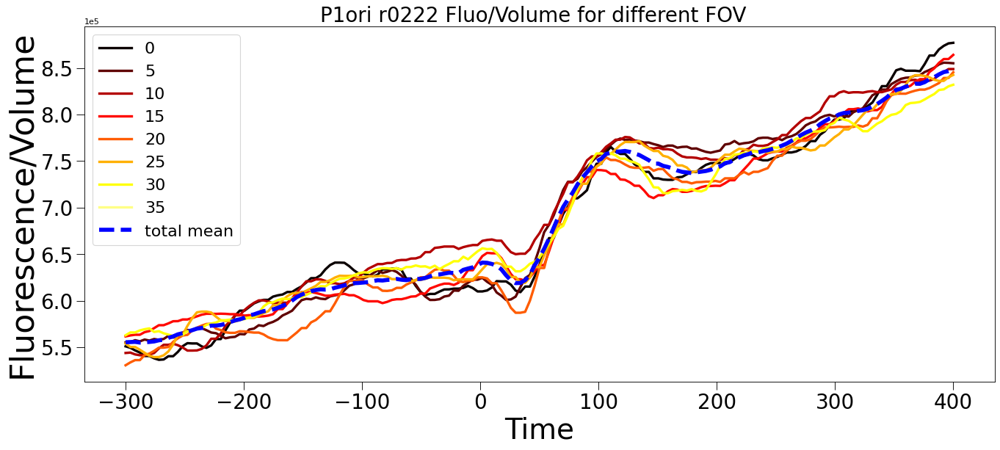

In [7]:
fig=plt.figure(num=None, figsize=(20, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1 )
ax.set_xlabel("Time", fontsize=35)
ax.set_ylabel('Fluorescence/Volume', fontsize=40)
ax.tick_params(which='major', length=10, labelsize=25)
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori r0222 Fluo/Volume for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1)) ].tTrans, 
            p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1))].Itot/
            p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p1ori_growth_r1.tTrans,(p1ori_growth_r1.Itot/p1ori_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=5, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1ori_r0222_fluo_fov.pdf')

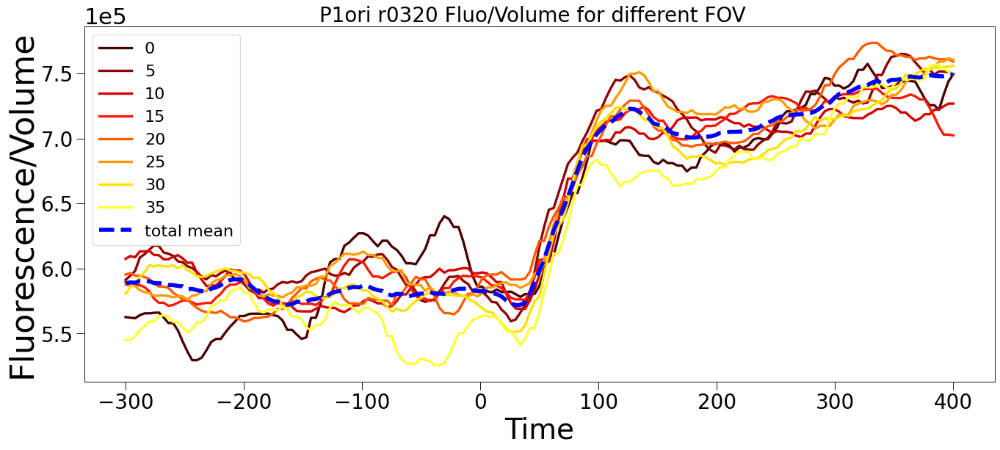

In [10]:
fig=plt.figure(num=None, figsize=(20, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1 )
ax.set_xlabel("Time", fontsize=35)
ax.set_ylabel('Fluorescence/Volume', fontsize=40)
ax.tick_params(which='major', length=10, labelsize=25)
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax.yaxis.offsetText.set_fontsize(28)

ax.set_title('P1ori r0320 Fluo/Volume for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1)) ].tTrans, 
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].Itot/
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p1ori_growth_r2.tTrans,(p1ori_growth_r2.Itot/p1ori_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=5, label='total mean')
    
#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)
plt.savefig('/home/valerio/tesi/data_managment/P1ori_r0320_fluo_fov.pdf')

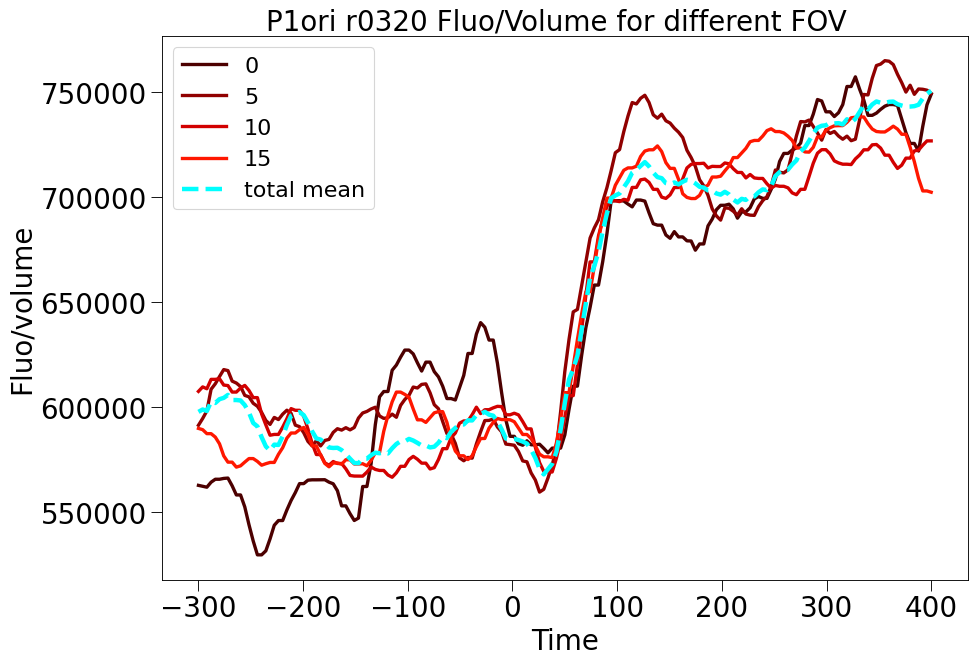

In [11]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Fluo/volume', fontsize=25)
ax.yaxis.offsetText.set_fontsize(28)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori r0320 Fluo/Volume for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates().head(15))/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1)) ].tTrans, 
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].Itot/
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p1ori_growth_r2[p1ori_growth_r2.fov<16].tTrans,
                (p1ori_growth_r2[p1ori_growth_r2.fov<16].Itot/p1ori_growth_r2[p1ori_growth_r2.fov<16].V)
                 ,4,20,-300,400,interval='custom'),'--', color='cyan', linewidth=4, label='total mean')
    
#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

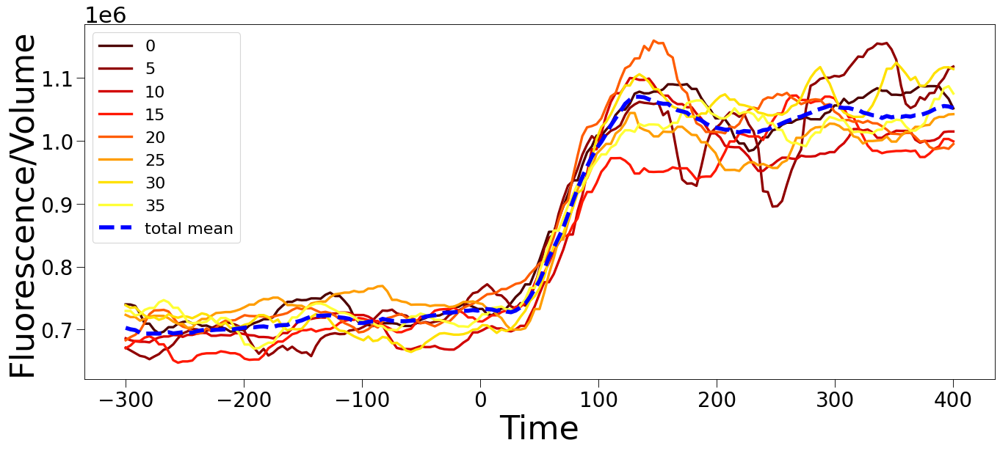

In [12]:
fig=plt.figure(num=None, figsize=(20, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1 )
ax.set_xlabel("Time", fontsize=40)
ax.set_ylabel('Fluorescence/Volume', fontsize=40)
ax.tick_params(which='major', length=10, labelsize=25)
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax.yaxis.offsetText.set_fontsize(28)
#ax.set_title('p1longori r0229 Fluo/Volume for different FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r1.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1))].Itot/
            p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r1.tTrans,(p1longori_growth_r1.Itot/p1longori_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=5, label='total mean')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0229_fluo_fov.pdf')

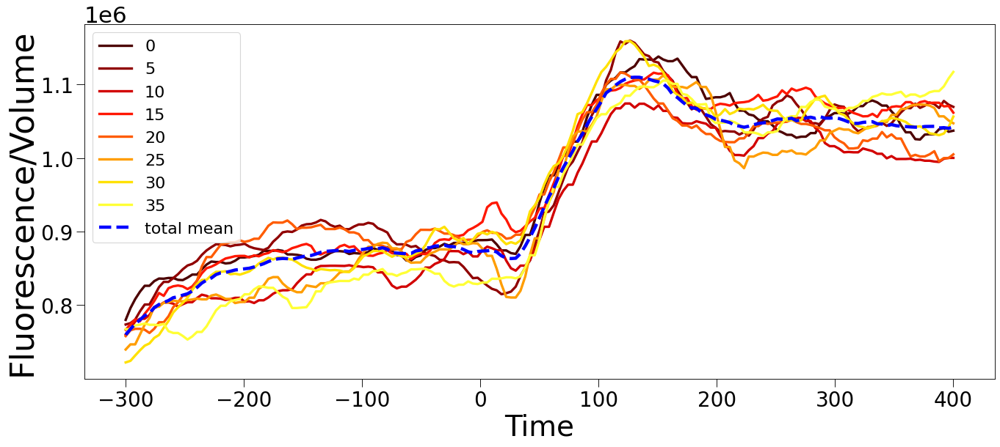

In [13]:
fig=plt.figure(num=None, figsize=(20, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1 )
ax.set_xlabel("Time", fontsize=35)
ax.set_ylabel('Fluorescence/Volume', fontsize=40)
ax.tick_params(which='major', length=10, labelsize=25)
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax.yaxis.offsetText.set_fontsize(28)
#ax.set_title('p1longori r0308 Fluo/Volume for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1))].Itot/
            p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r2.tTrans,(p1longori_growth_r2.Itot/p1longori_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0308_fluo_fov.pdf')

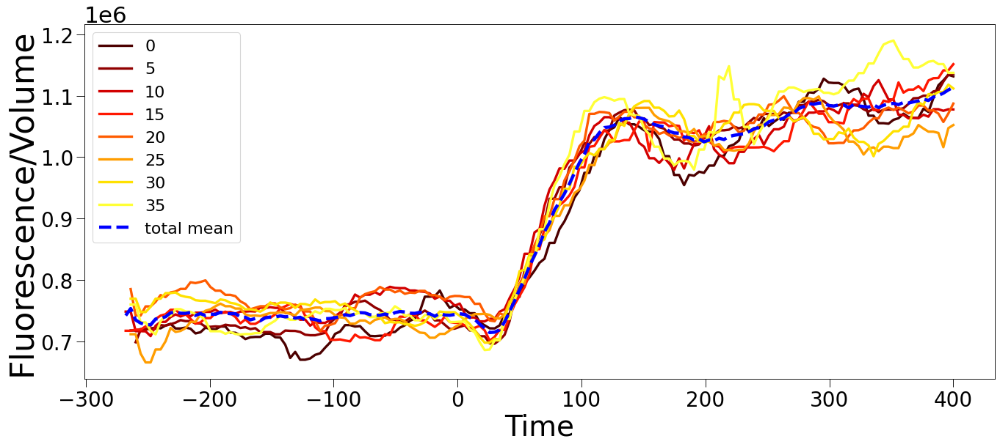

In [14]:
fig=plt.figure(num=None, figsize=(20, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1 )
ax.set_xlabel("Time", fontsize=35)
ax.set_ylabel('Fluorescence/Volume', fontsize=40)
ax.tick_params(which='major', length=10, labelsize=25)
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax.yaxis.offsetText.set_fontsize(28)
#ax.set_title('p1longori r0323 Fluo/Volume for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r3.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1))].Itot/
            p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r3.tTrans,(p1longori_growth_r3.Itot/p1longori_growth_r3.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0323_fluo_fov.pdf')

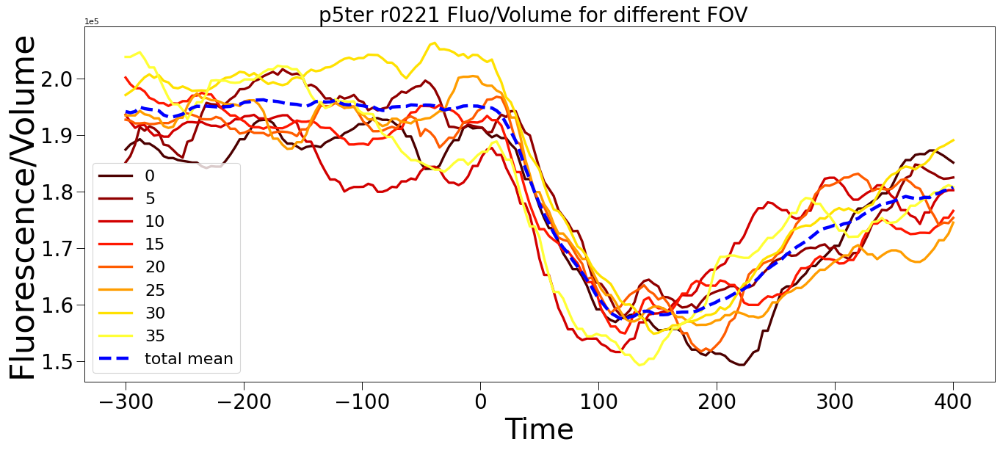

In [13]:
fig=plt.figure(num=None, figsize=(20, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1 )
ax.set_xlabel("Time", fontsize=35)
ax.set_ylabel('Fluorescence/Volume', fontsize=40)
ax.tick_params(which='major', length=10, labelsize=25)
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax.set_title('p5ter r0221 Fluo/Volume for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))



for i in range(int(len(p5ter_growth_r1.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1)) ].tTrans, 
            p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1))].Itot/
            p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p5ter_growth_r1.tTrans,(p5ter_growth_r1.Itot/p5ter_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', linewidth=4, label='total mean', color='blue')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P5ter_r0221_fluo_fov.pdf')

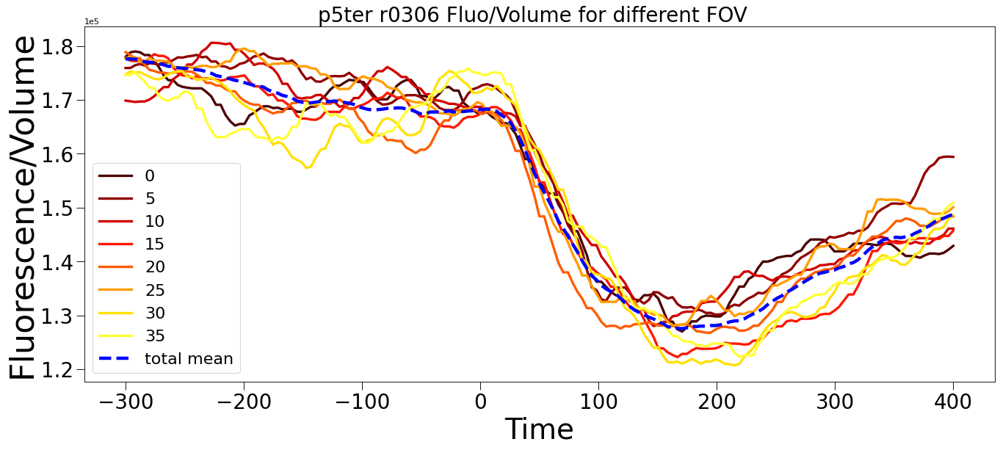

In [14]:
fig=plt.figure(num=None, figsize=(20, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1 )
ax.set_xlabel("Time", fontsize=35)
ax.set_ylabel('Fluorescence/Volume', fontsize=40)
ax.tick_params(which='major', length=10, labelsize=25)
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p5ter r0306 Fluo/Volume for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p5ter_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1)) ].tTrans, 
            p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1))].Itot/
            p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p5ter_growth_r2.tTrans,(p5ter_growth_r2.Itot/p5ter_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', linewidth=4, label='total mean', color='blue')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P5ter_r0306_fluo_fov.pdf')

# ANALISI DI MADRI E FIGLI P1ORI GROWTH



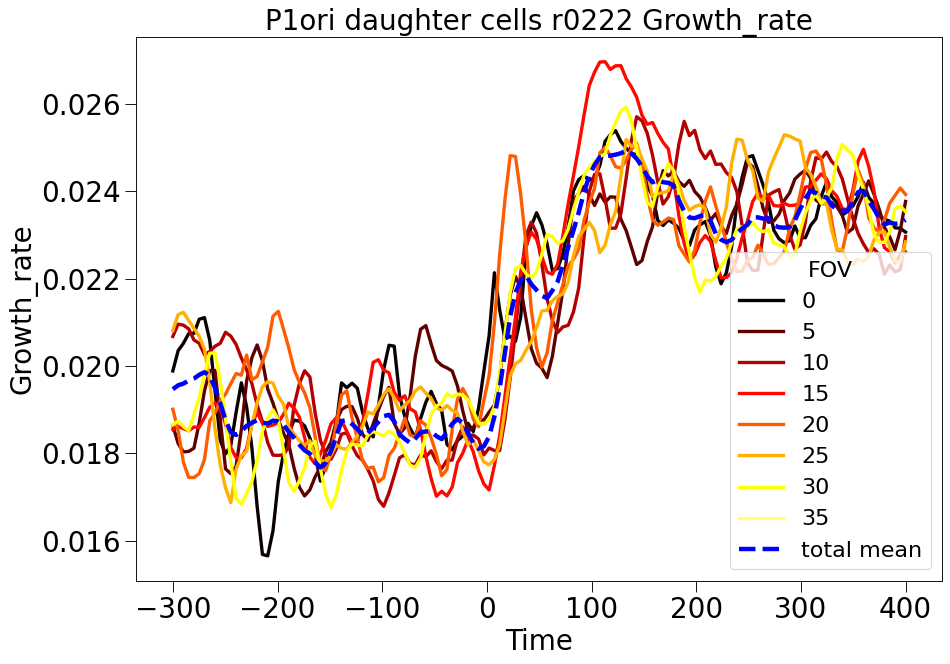

In [15]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori daughter cells r0222 Growth_rate', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(daughter_r1_p1ori[(daughter_r1_p1ori.fov >5*i) & (daughter_r1_p1ori.fov <5*(i+1)) ].tTrans, 
            daughter_r1_p1ori[(daughter_r1_p1ori.fov >5*i) & (daughter_r1_p1ori.fov <5*(i+1))].der/
            daughter_r1_p1ori[(daughter_r1_p1ori.fov >5*i) & (daughter_r1_p1ori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(daughter_r1_p1ori.tTrans,(daughter_r1_p1ori.der/daughter_r1_p1ori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)


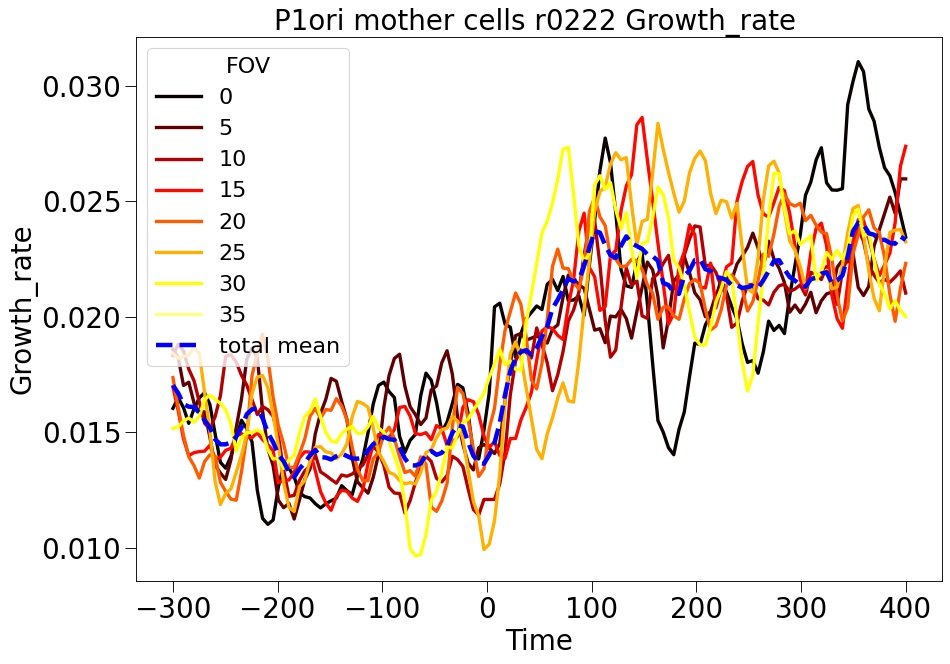

In [16]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori mother cells r0222 Growth_rate ', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(mother_r1_p1ori[(mother_r1_p1ori.fov >5*i) & (mother_r1_p1ori.fov <5*(i+1)) ].tTrans, 
            mother_r1_p1ori[(mother_r1_p1ori.fov >5*i) & (mother_r1_p1ori.fov <5*(i+1))].der/
            mother_r1_p1ori[(mother_r1_p1ori.fov >5*i) & (mother_r1_p1ori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(mother_r1_p1ori.tTrans,(mother_r1_p1ori.der/mother_r1_p1ori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)


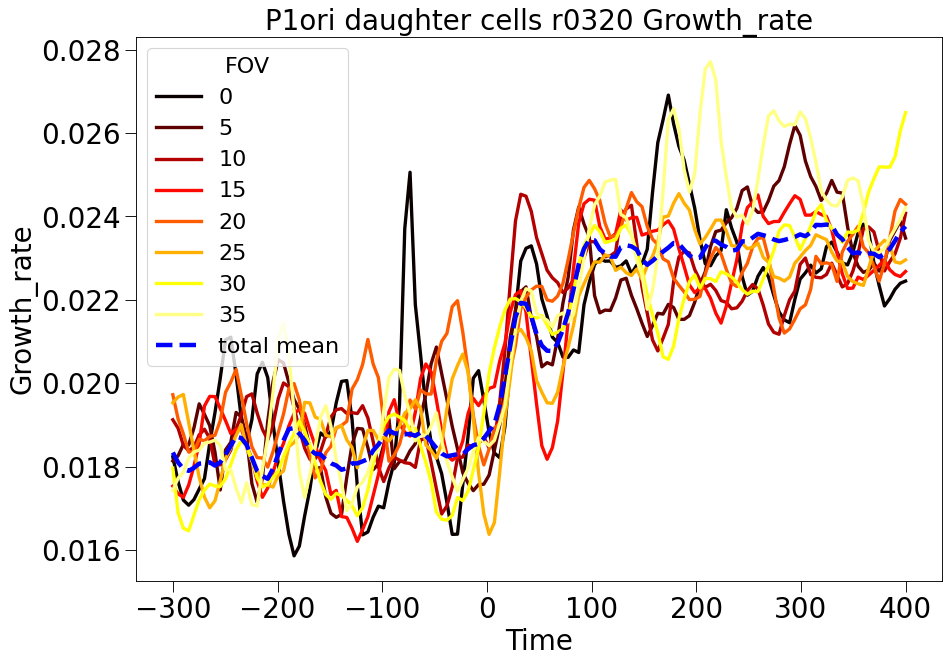

In [17]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori daughter cells r0320 Growth_rate', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(daughter_r2_p1ori[(daughter_r2_p1ori.fov >5*i) & (daughter_r2_p1ori.fov <5*(i+1)) ].tTrans, 
            daughter_r2_p1ori[(daughter_r2_p1ori.fov >5*i) & (daughter_r2_p1ori.fov <5*(i+1))].der/
            daughter_r2_p1ori[(daughter_r2_p1ori.fov >5*i) & (daughter_r2_p1ori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(daughter_r2_p1ori.tTrans,(daughter_r2_p1ori.der/daughter_r2_p1ori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)


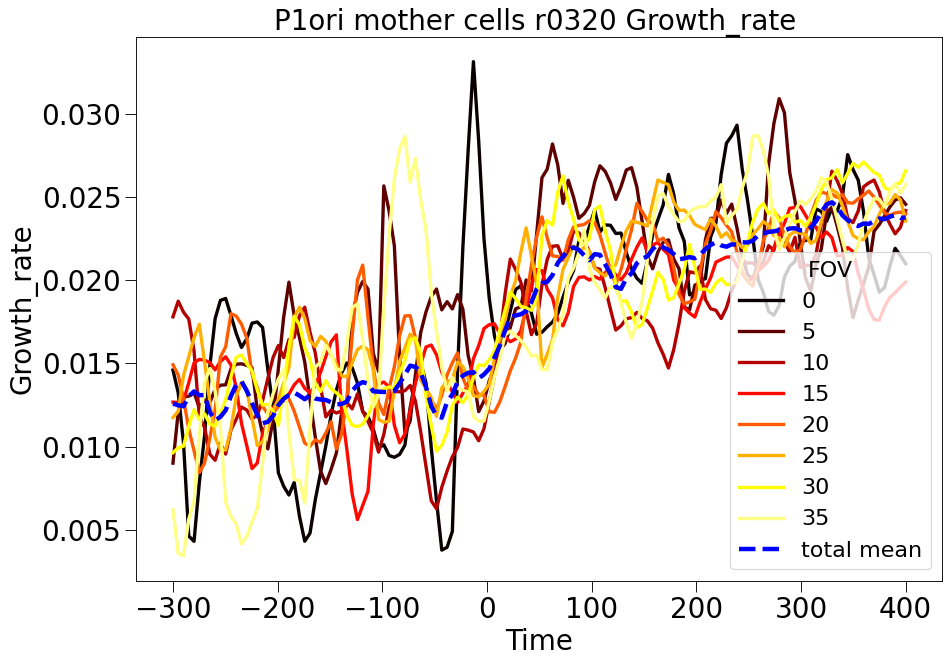

In [18]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori mother cells r0320 Growth_rate ', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(mother_r2_p1ori[(mother_r2_p1ori.fov >5*i) & (mother_r2_p1ori.fov <5*(i+1)) ].tTrans, 
            mother_r2_p1ori[(mother_r2_p1ori.fov >5*i) & (mother_r2_p1ori.fov <5*(i+1))].der/
            mother_r2_p1ori[(mother_r2_p1ori.fov >5*i) & (mother_r2_p1ori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(mother_r2_p1ori.tTrans,(mother_r2_p1ori.der/mother_r2_p1ori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)


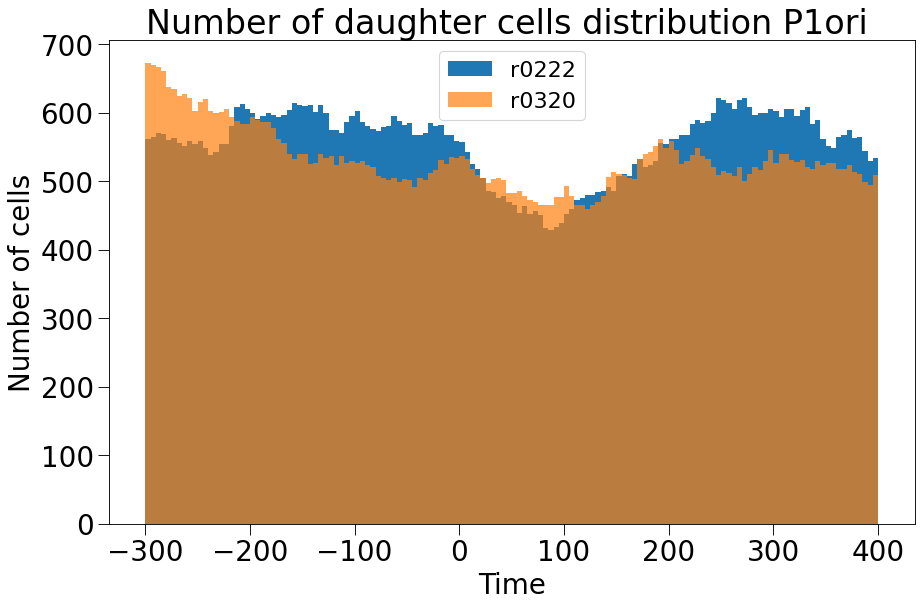

In [19]:
fig=plt.figure(num=None, figsize=(13, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Number of cells', fontsize=25)
#ax.set_xlim(-100,300)

ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('Number of daughter cells distribution P1ori ', fontsize=30)


#ax.set_xlim(-100,400)


h1=ax.hist(daughter_r1_p1ori.tTrans , bins=140, range=(-300,400),label='r0222')
h2=ax.hist(daughter_r2_p1ori.tTrans , bins=140, range=(-300,400),alpha=0.7,label='r0320')

ax.legend(fontsize=20)

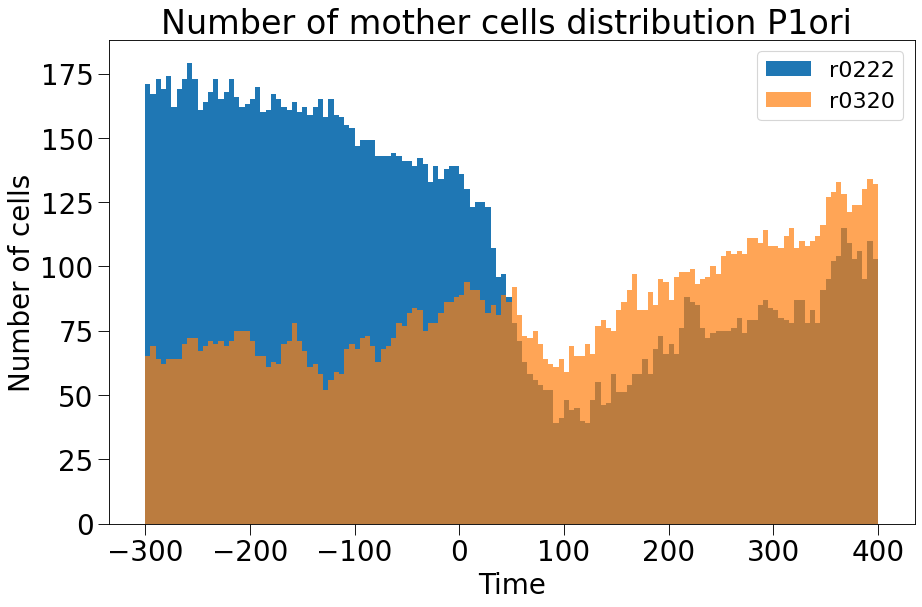

In [20]:
fig=plt.figure(num=None, figsize=(13, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Number of cells', fontsize=25)
#ax.set_xlim(-100,300)

ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('Number of mother cells distribution P1ori ', fontsize=30)


#ax.set_xlim(-100,400)


h1=ax.hist(mother_r1_p1ori.tTrans , bins=140, range=(-300,400),label='r0222')
h2=ax.hist(mother_r2_p1ori.tTrans , bins=140, range=(-300,400),alpha=0.7,label='r0320')

ax.legend(fontsize=20)

# SAME FOR P1LONGORI

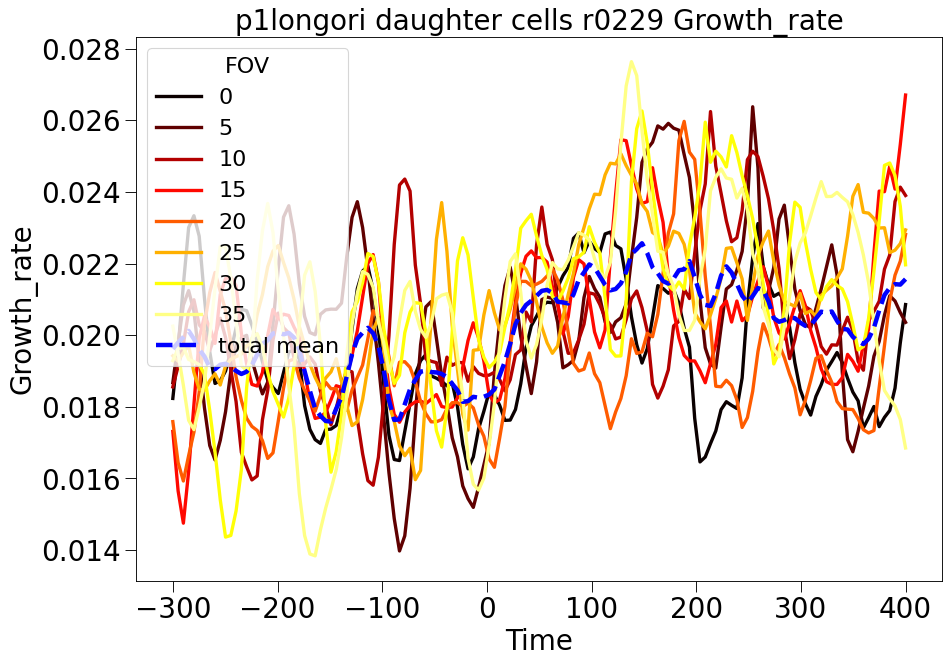

In [21]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori daughter cells r0229 Growth_rate', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1longori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(daughter_r1_p1longori[(daughter_r1_p1longori.fov >5*i) & (daughter_r1_p1longori.fov <5*(i+1)) ].tTrans, 
            daughter_r1_p1longori[(daughter_r1_p1longori.fov >5*i) & (daughter_r1_p1longori.fov <5*(i+1))].der/
            daughter_r1_p1longori[(daughter_r1_p1longori.fov >5*i) & (daughter_r1_p1longori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(daughter_r1_p1longori.tTrans,(daughter_r1_p1longori.der/daughter_r1_p1longori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)


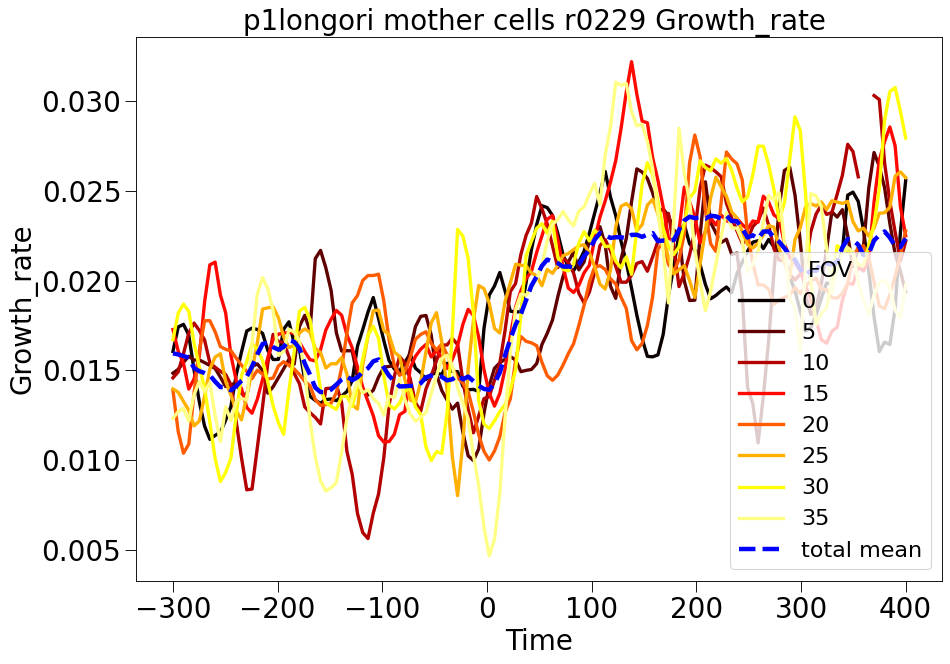

In [22]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori mother cells r0229 Growth_rate ', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1longori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(mother_r1_p1longori[(mother_r1_p1longori.fov >5*i) & (mother_r1_p1longori.fov <5*(i+1)) ].tTrans, 
            mother_r1_p1longori[(mother_r1_p1longori.fov >5*i) & (mother_r1_p1longori.fov <5*(i+1))].der/
            mother_r1_p1longori[(mother_r1_p1longori.fov >5*i) & (mother_r1_p1longori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(mother_r1_p1longori.tTrans,(mother_r1_p1longori.der/mother_r1_p1longori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0229_growth_mother.pdf')

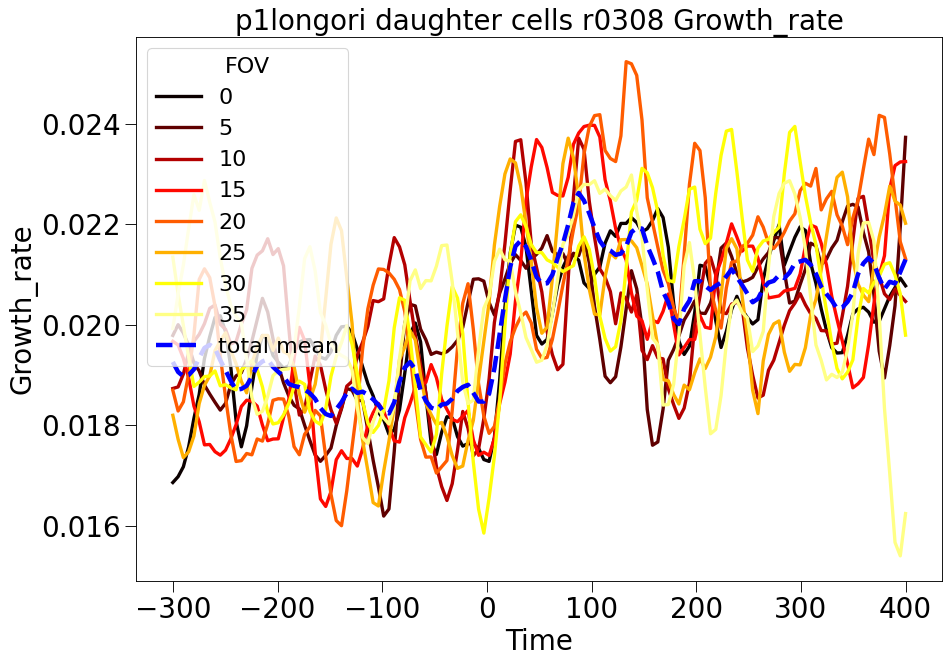

In [23]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori daughter cells r0308 Growth_rate', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1longori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(daughter_r2_p1longori[(daughter_r2_p1longori.fov >5*i) & (daughter_r2_p1longori.fov <5*(i+1)) ].tTrans, 
            daughter_r2_p1longori[(daughter_r2_p1longori.fov >5*i) & (daughter_r2_p1longori.fov <5*(i+1))].der/
            daughter_r2_p1longori[(daughter_r2_p1longori.fov >5*i) & (daughter_r2_p1longori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(daughter_r2_p1longori.tTrans,(daughter_r2_p1longori.der/daughter_r2_p1longori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)


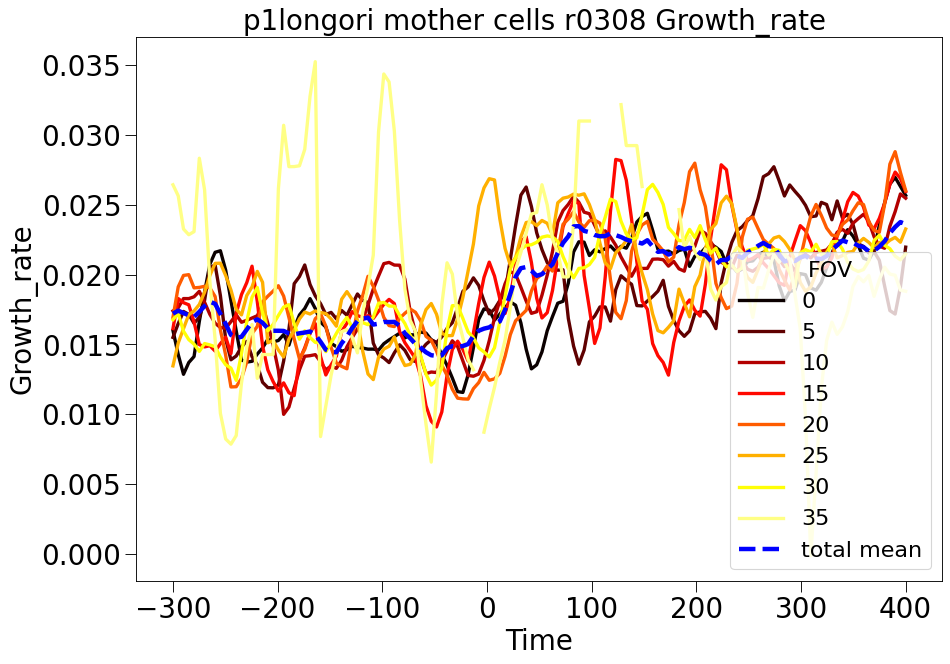

In [24]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori mother cells r0308 Growth_rate ', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1longori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(mother_r2_p1longori[(mother_r2_p1longori.fov >5*i) & (mother_r2_p1longori.fov <5*(i+1)) ].tTrans, 
            mother_r2_p1longori[(mother_r2_p1longori.fov >5*i) & (mother_r2_p1longori.fov <5*(i+1))].der/
            mother_r2_p1longori[(mother_r2_p1longori.fov >5*i) & (mother_r2_p1longori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(mother_r2_p1longori.tTrans,(mother_r2_p1longori.der/mother_r2_p1longori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0308_growth_mother.pdf')

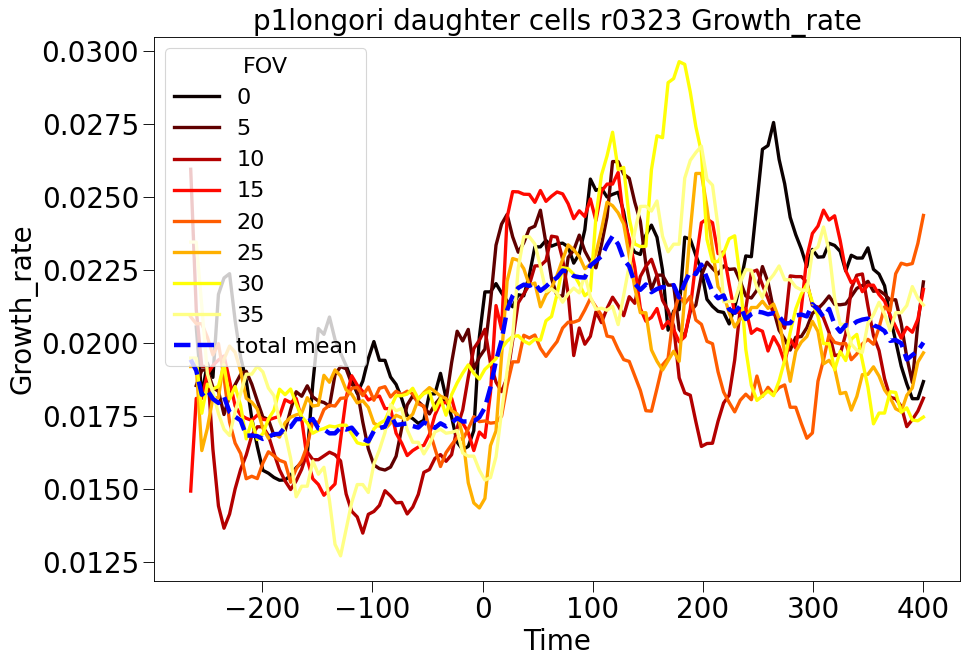

In [25]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori daughter cells r0323 Growth_rate', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1longori_growth_r3.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(daughter_r3_p1longori[(daughter_r3_p1longori.fov >5*i) & (daughter_r3_p1longori.fov <5*(i+1)) ].tTrans, 
            daughter_r3_p1longori[(daughter_r3_p1longori.fov >5*i) & (daughter_r3_p1longori.fov <5*(i+1))].der/
            daughter_r3_p1longori[(daughter_r3_p1longori.fov >5*i) & (daughter_r3_p1longori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(daughter_r3_p1longori.tTrans,(daughter_r3_p1longori.der/daughter_r3_p1longori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)


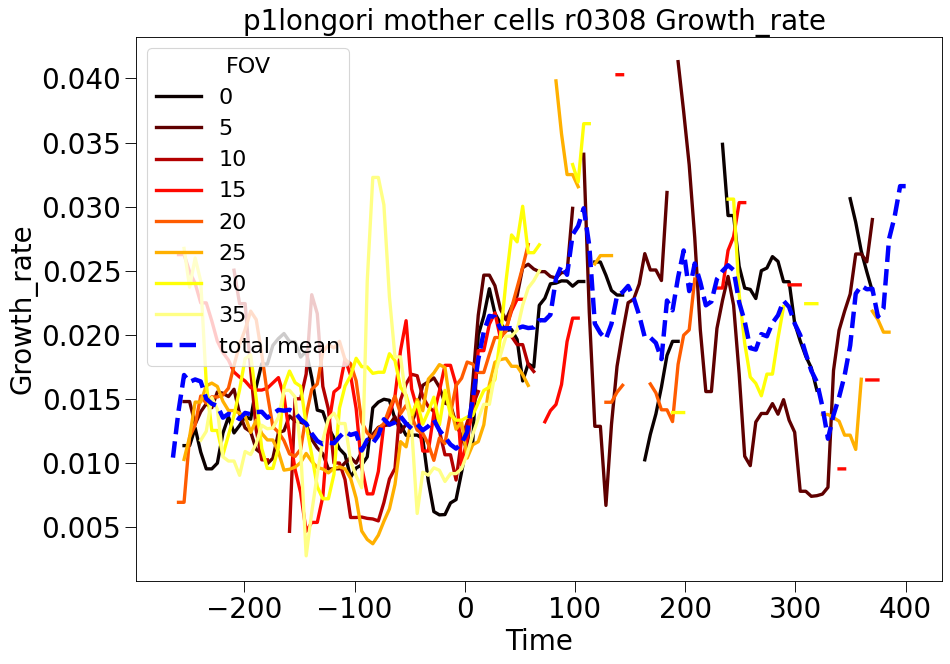

In [26]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori mother cells r0308 Growth_rate ', fontsize=25)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1longori_growth_r3.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,140),
            bin_mean(mother_r3_p1longori[(mother_r3_p1longori.fov >5*i) & (mother_r3_p1longori.fov <5*(i+1)) ].tTrans, 
            mother_r3_p1longori[(mother_r3_p1longori.fov >5*i) & (mother_r3_p1longori.fov <5*(i+1))].der/
            mother_r3_p1longori[(mother_r3_p1longori.fov >5*i) & (mother_r3_p1longori.fov <5*(i+1))].V
            ,5,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,140),bin_mean(mother_r3_p1longori.tTrans,(mother_r3_p1longori.der/mother_r3_p1longori.V)
                 ,5,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(title='FOV',fontsize=20, title_fontsize=20)


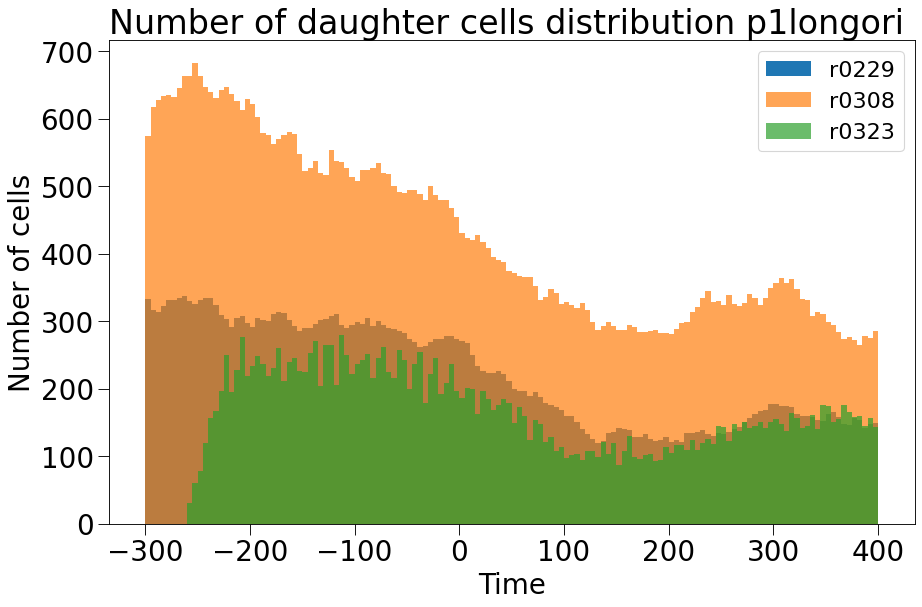

In [27]:
fig=plt.figure(num=None, figsize=(13, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Number of cells', fontsize=25)
#ax.set_xlim(-100,300)

ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('Number of daughter cells distribution p1longori ', fontsize=30)


#ax.set_xlim(-100,400)


h1=ax.hist(daughter_r1_p1longori.tTrans , bins=140, range=(-300,400),label='r0229')
h2=ax.hist(daughter_r2_p1longori.tTrans , bins=140, range=(-300,400),alpha=0.7,label='r0308')
h3=ax.hist(daughter_r3_p1longori.tTrans , bins=140, range=(-300,400),alpha=0.7,label='r0323')


ax.legend(fontsize=20)

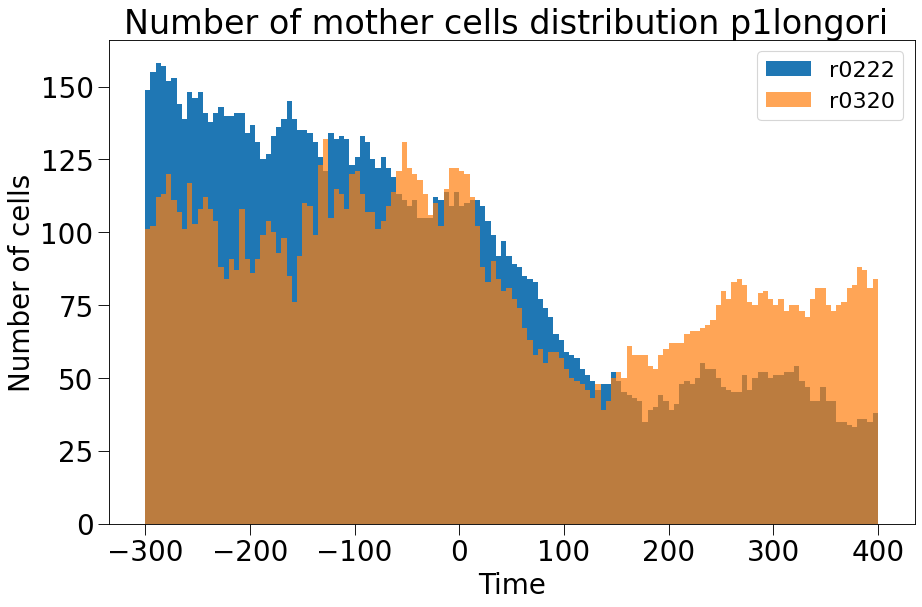

In [28]:
fig=plt.figure(num=None, figsize=(13, 8), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Number of cells', fontsize=25)
#ax.set_xlim(-100,300)

ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('Number of mother cells distribution p1longori ', fontsize=30)


#ax.set_xlim(-100,400)


h1=ax.hist(mother_r1_p1longori.tTrans , bins=140, range=(-300,400),label='r0222')
h2=ax.hist(mother_r2_p1longori.tTrans , bins=140, range=(-300,400),alpha=0.7,label='r0320')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_mother_distribution.pdf')

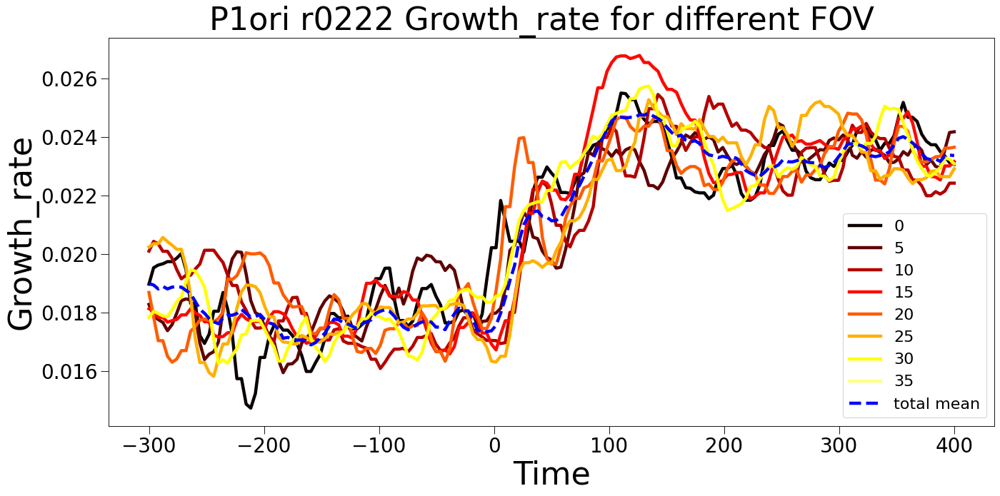

In [18]:
fig=plt.figure(num=None, figsize=(20, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori r0222 Growth_rate for different FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1)) ].tTrans, 
            p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1))].der/
            p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=4, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p1ori_growth_r1.tTrans,(p1ori_growth_r1.der/p1ori_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

#plt.savefig('/home/valerio/tesi/data_managment/P1ori_r0222_growth_fov.pdf')

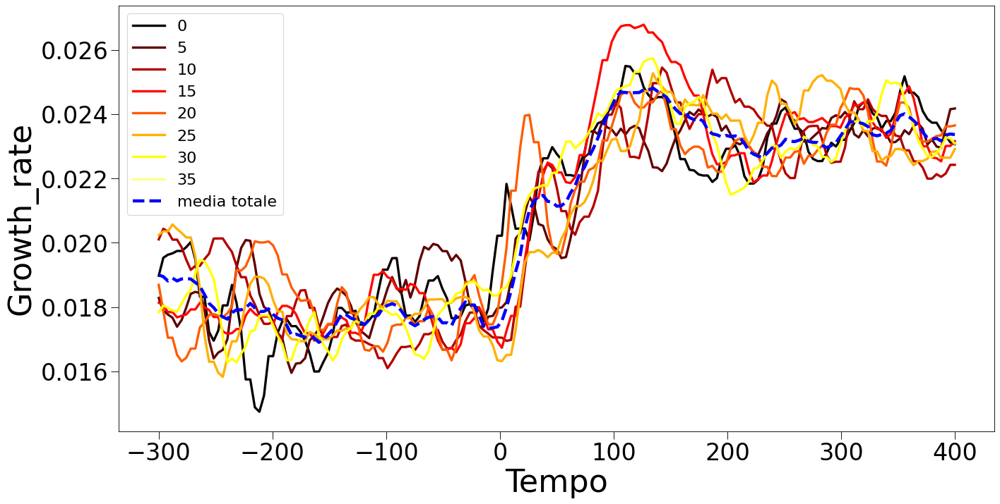

In [3]:
fig=plt.figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Tempo", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=30)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

#ax.set_title('P1ori r0222 Growth rate per diversi FOV   ', fontsize=40)

colors = plt.cm.hot(np.linspace(0,1,9))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1)) ].tTrans, 
            p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1))].der/
            p1ori_growth_r1[(p1ori_growth_r1.fov >5*i) & (p1ori_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p1ori_growth_r1.tTrans,(p1ori_growth_r1.der/p1ori_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='media totale')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1ori_r0222_growth_fov.pdf')

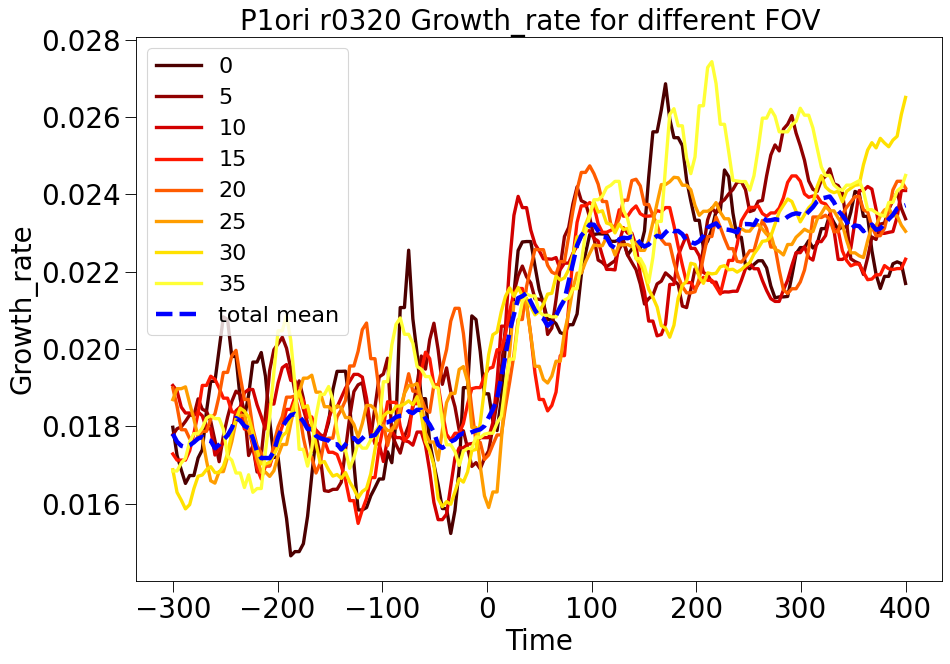

In [101]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori r0320 Growth_rate for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1)) ].tTrans, 
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].der/
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p1ori_growth_r2.tTrans,(p1ori_growth_r2.der/p1ori_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')
    
#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

#plt.savefig('/home/valerio/tesi/data_managment/P1ori_r0320_growth_fov.pdf')

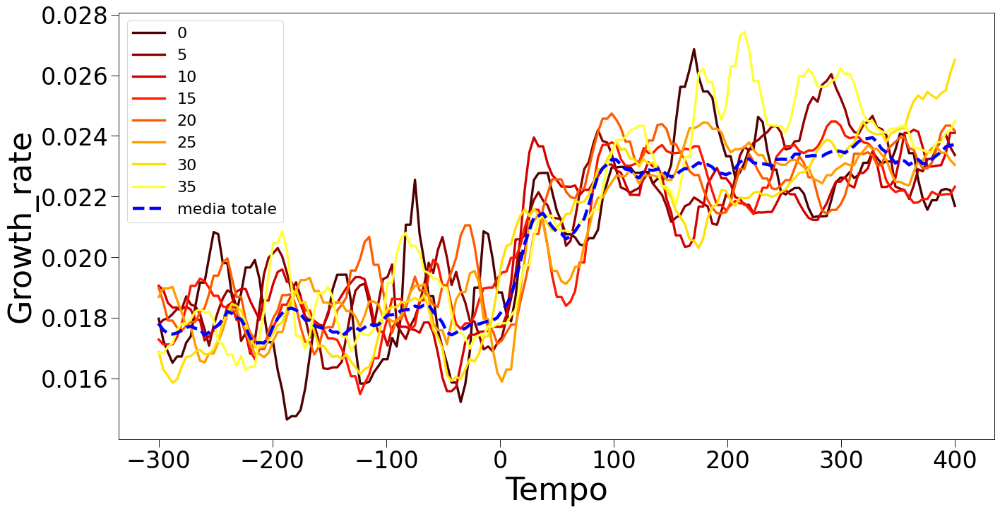

In [4]:
fig=plt.figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Tempo", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=30)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

#ax.set_title('P1ori r0320 Growth_rate per diversi FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1)) ].tTrans, 
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].der/
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p1ori_growth_r2.tTrans,(p1ori_growth_r2.der/p1ori_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='media totale')
    
#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1ori_r0320_growth_fov.pdf')

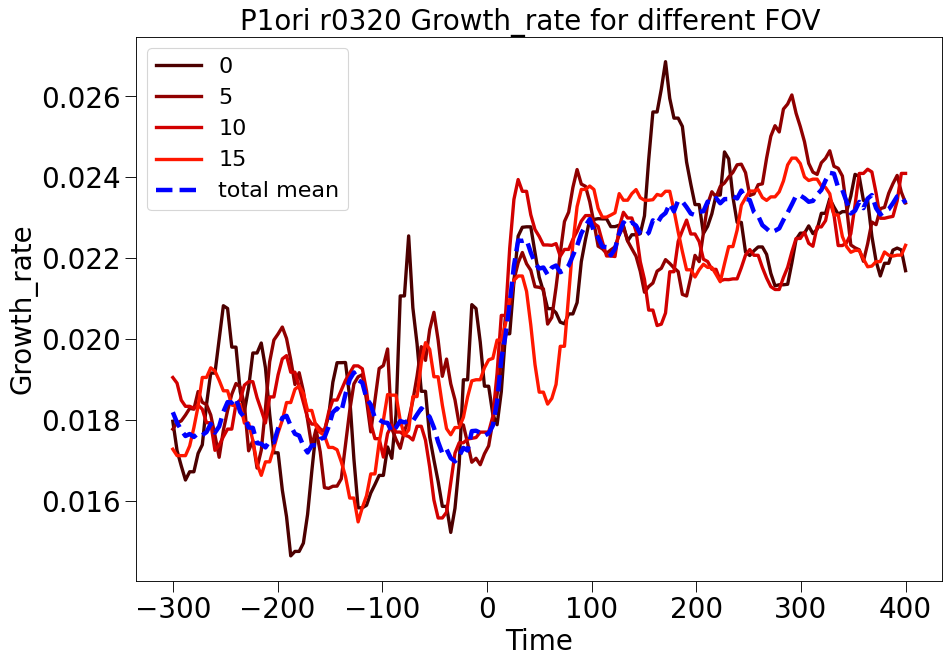

In [102]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('P1ori r0320 Growth_rate for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1ori_growth_r2.fov.drop_duplicates().head(15))/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1)) ].tTrans, 
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].der/
            p1ori_growth_r2[(p1ori_growth_r2.fov >5*i) & (p1ori_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p1ori_growth_r2[p1ori_growth_r2.fov<16].tTrans,
                (p1ori_growth_r2[p1ori_growth_r2.fov<16].der/p1ori_growth_r2[p1ori_growth_r2.fov<16].V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')
    
#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)



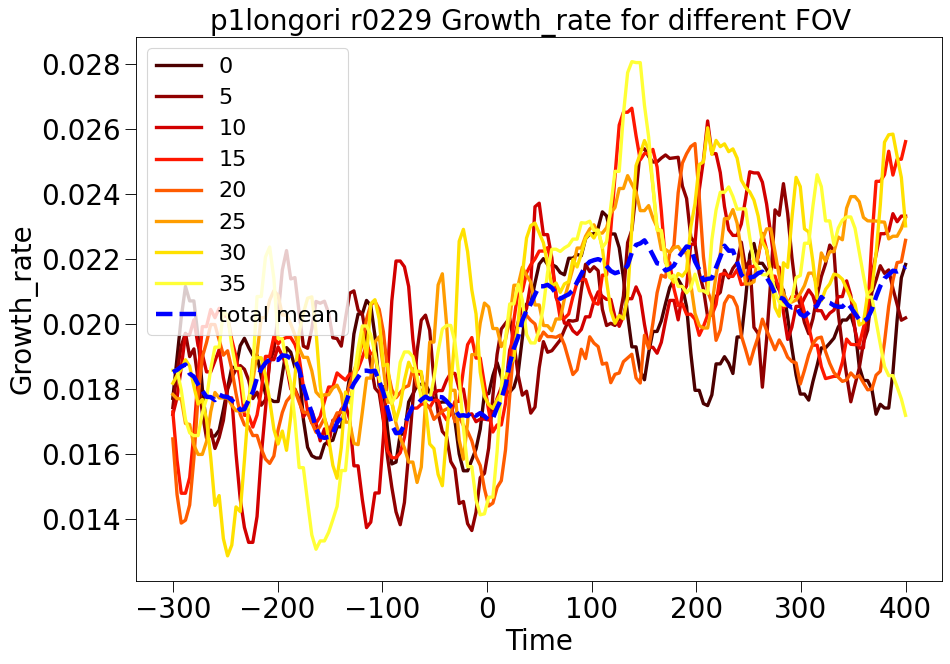

In [103]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori r0229 Growth_rate for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r1.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1))].der/
            p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r1.tTrans,(p1longori_growth_r1.der/p1longori_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

ax.legend(fontsize=20)

#plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0229_growth_fov.pdf')

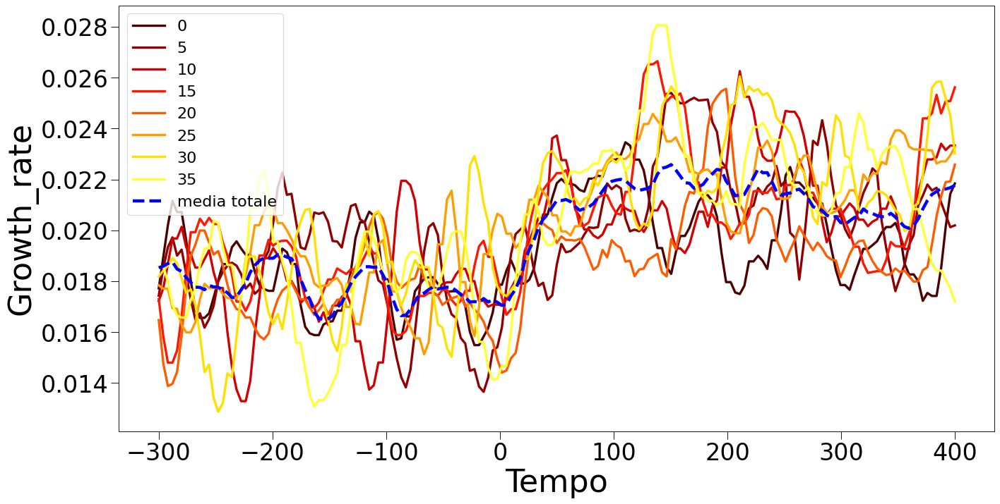

In [5]:
fig=plt.figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Tempo", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=30)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

#ax.set_title('p1longori r0229 Growth_rate per diversi FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r1.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1))].der/
            p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r1.tTrans,(p1longori_growth_r1.der/p1longori_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='media totale')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0229_growth_fov.pdf')

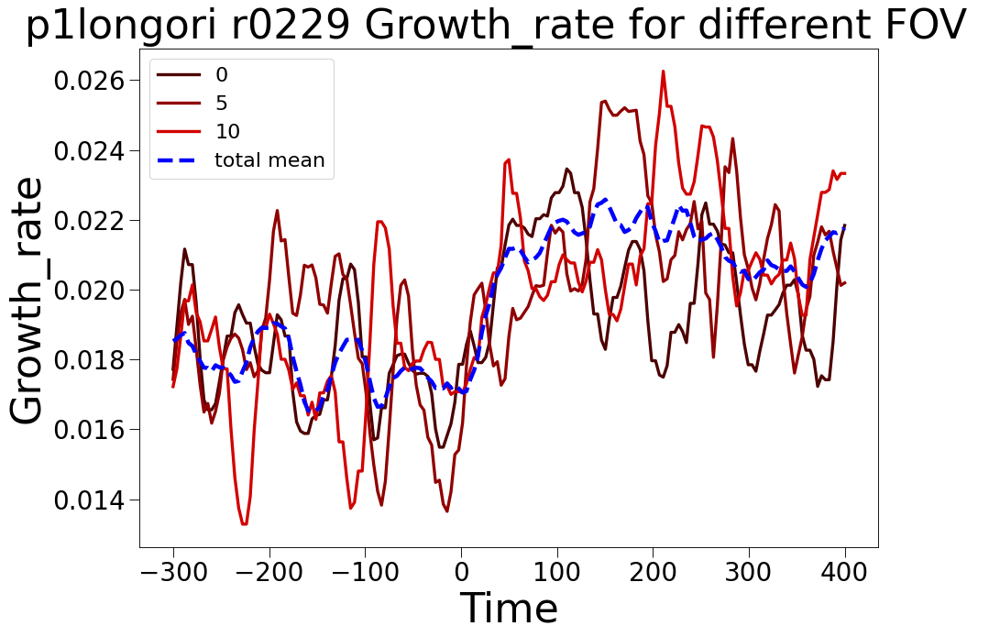

In [23]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori r0229 Growth_rate for different FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r1.fov.drop_duplicates().head(14))/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1))].der/
            p1longori_growth_r1[(p1longori_growth_r1.fov >5*i) & (p1longori_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r1.tTrans,(p1longori_growth_r1.der/p1longori_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

ax.legend(fontsize=20)



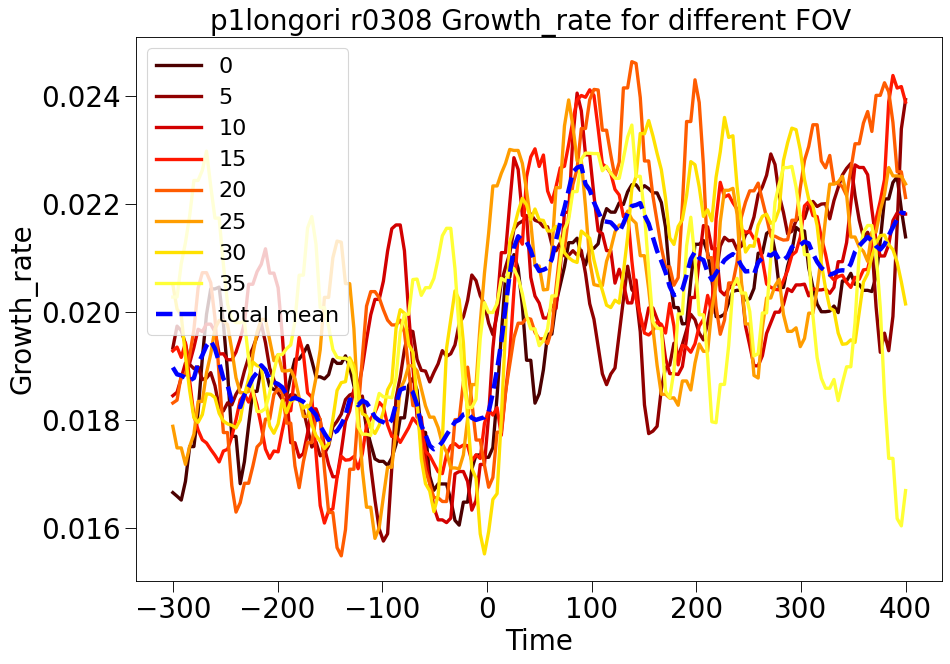

In [105]:
fig=plt.figure(num=None, figsize=(20, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori r0308 Growth_rate for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1))].der/
            p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r2.tTrans,(p1longori_growth_r2.der/p1longori_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

ax.legend(fontsize=20)

#plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0308_growth_fov.pdf')

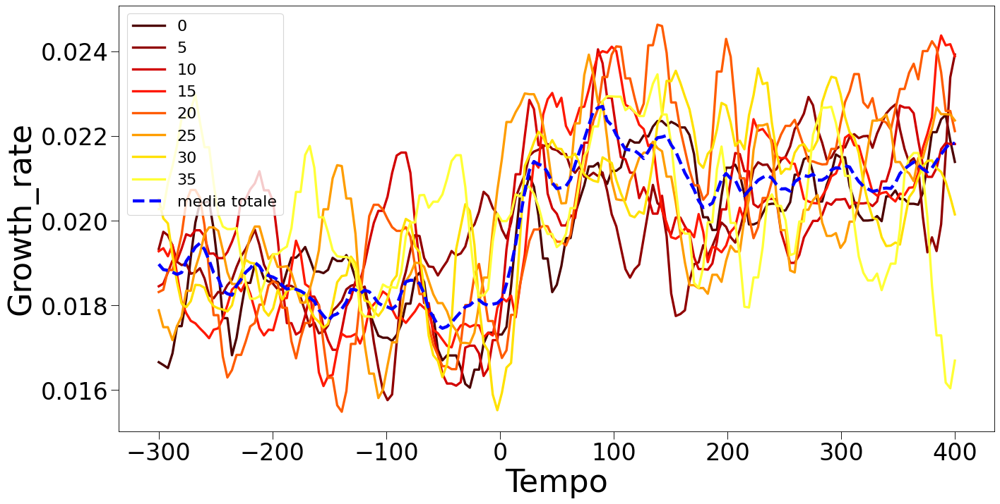

In [6]:
fig=plt.figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Tempo", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=30)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

#ax.set_title('p1longori r0308 Growth_rate per diversi FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1))].der/
            p1longori_growth_r2[(p1longori_growth_r2.fov >5*i) & (p1longori_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r2.tTrans,(p1longori_growth_r2.der/p1longori_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='media totale')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0308_growth_fov.pdf')

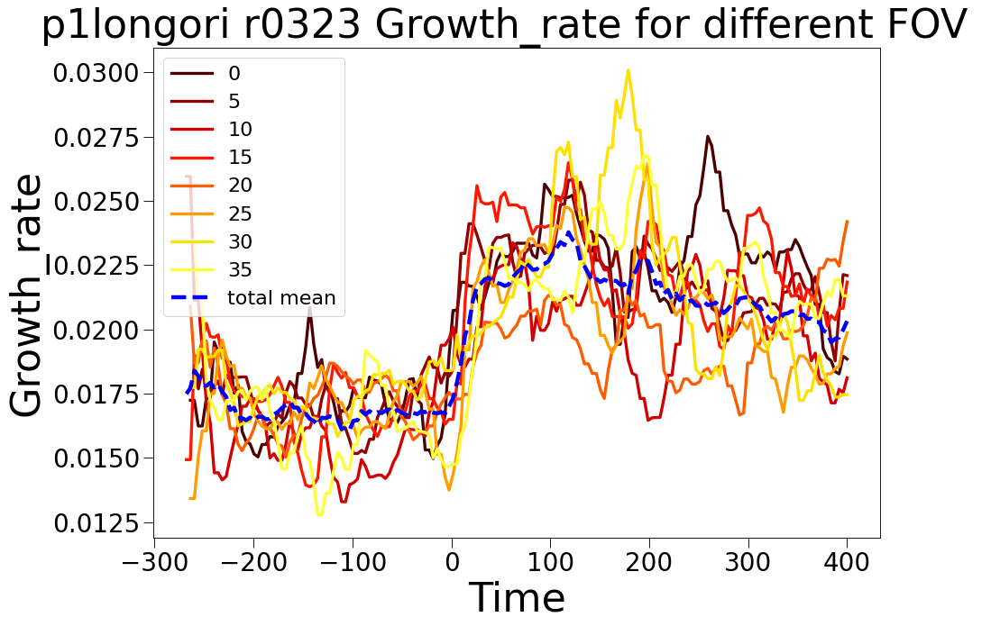

In [25]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p1longori r0323 Growth_rate for different FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r3.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1))].der/
            p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r3.tTrans,(p1longori_growth_r3.der/p1longori_growth_r3.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='total mean')

ax.legend(fontsize=20)

#plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0323_growth_fov.pdf')

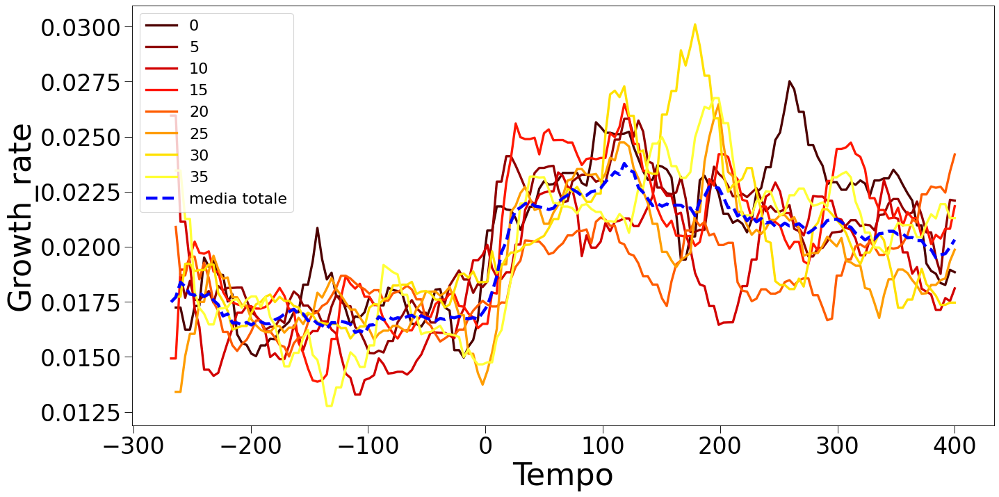

In [7]:
fig=plt.figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Tempo", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=30)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

#ax.set_title('p1longori r0323 Growth_rate per diversi FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p1longori_growth_r3.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1)) ].tTrans, 
            p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1))].der/
            p1longori_growth_r3[(p1longori_growth_r3.fov >5*i) & (p1longori_growth_r3.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p1longori_growth_r3.tTrans,(p1longori_growth_r3.der/p1longori_growth_r3.V)
                 ,4,20,-300,400,interval='custom'),'--', color='blue', linewidth=4, label='media totale')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P1longori_r0323_growth_fov.pdf')

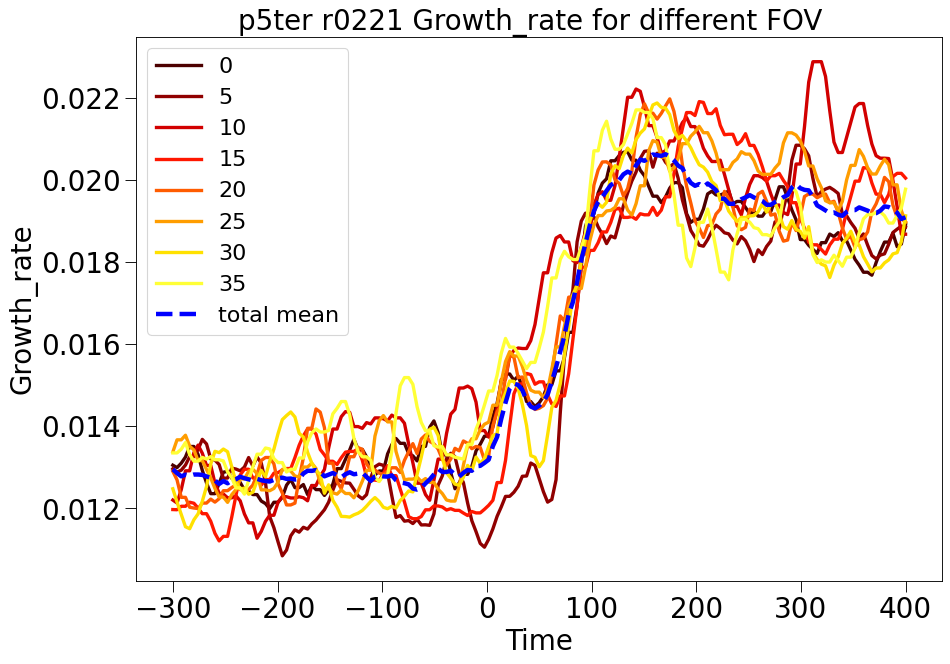

In [107]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p5ter r0221 Growth_rate for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))



for i in range(int(len(p5ter_growth_r1.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1)) ].tTrans, 
            p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1))].der/
            p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p5ter_growth_r1.tTrans,(p5ter_growth_r1.der/p5ter_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', linewidth=4, label='total mean', color='blue')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

#plt.savefig('/home/valerio/tesi/data_managment/P5ter_r0221_growth_fov.pdf')

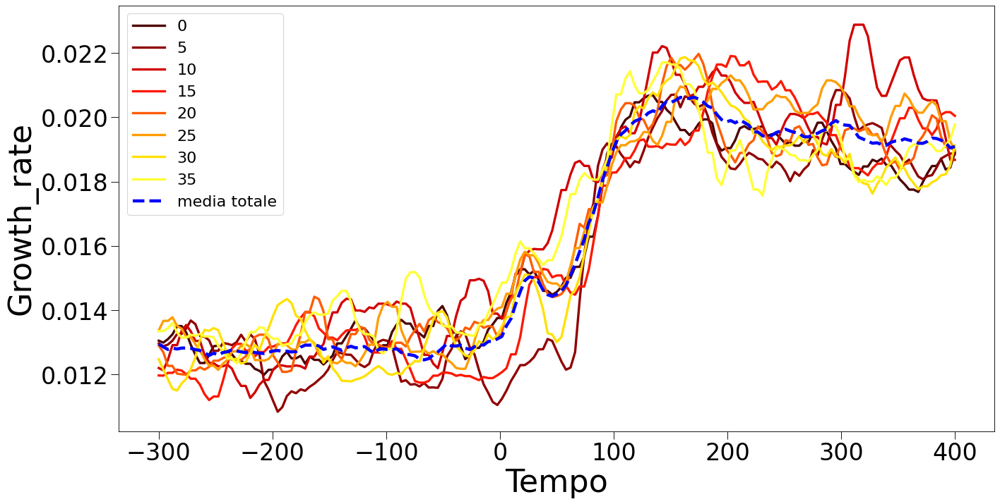

In [8]:
fig=plt.figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Tempo", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=30)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

#ax.set_title('p5ter r0221 Growth_rate per diversi FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))



for i in range(int(len(p5ter_growth_r1.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1)) ].tTrans, 
            p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1))].der/
            p5ter_growth_r1[(p5ter_growth_r1.fov >5*i) & (p5ter_growth_r1.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

ax.plot(np.linspace(-300,400,175),bin_mean(p5ter_growth_r1.tTrans,(p5ter_growth_r1.der/p5ter_growth_r1.V)
                 ,4,20,-300,400,interval='custom'),'--', linewidth=4, label='media totale', color='blue')

#ax.plot(np.linspace(-300,400,len(prova)),prova)
ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P5ter_r0221_growth_fov.pdf')

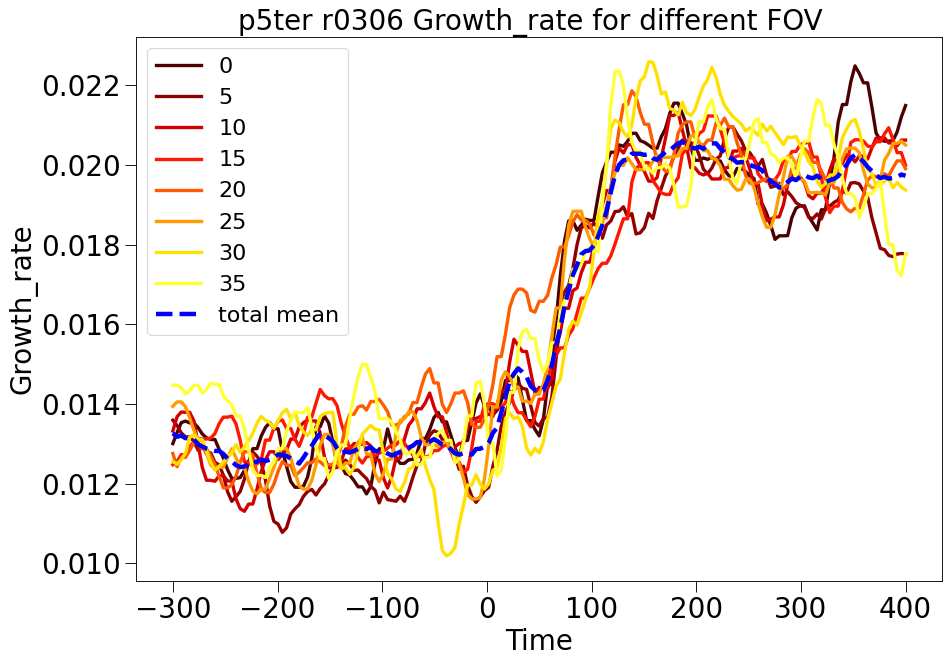

In [108]:
fig=plt.figure(num=None, figsize=(13, 9), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Time", fontsize=25)
ax.set_ylabel('Growth_rate', fontsize=25)


ax.tick_params(which='major', length=10, labelsize=25)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

ax.set_title('p5ter r0306 Growth_rate for different FOV  ', fontsize=25)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p5ter_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1)) ].tTrans, 
            p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1))].der/
            p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p5ter_growth_r2.tTrans,(p5ter_growth_r2.der/p5ter_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', linewidth=4, label='total mean', color='blue')

ax.legend(fontsize=20)

#plt.savefig('/home/valerio/tesi/data_managment/P5ter_r0306_growth_fov.pdf')

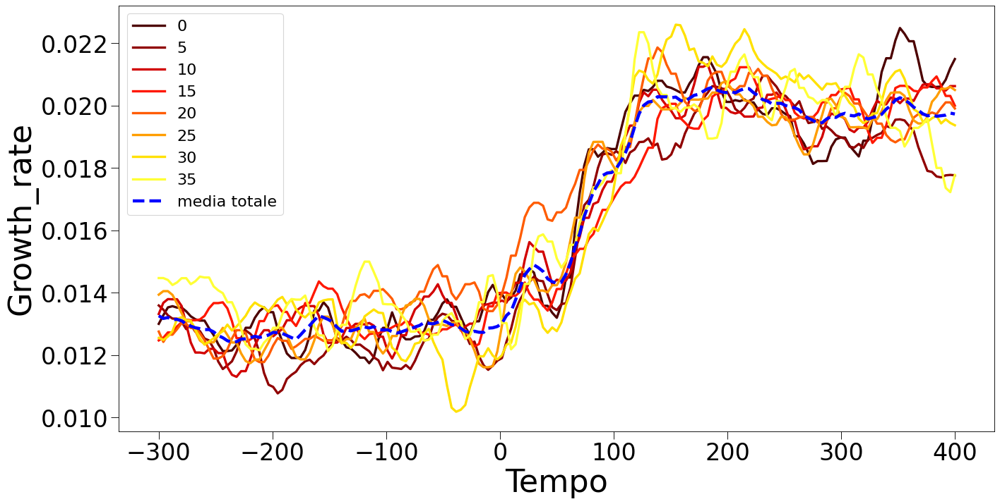

In [9]:
fig=plt.figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(1,1,1)

ax.set_xlabel("Tempo", fontsize=40)
ax.set_ylabel('Growth_rate', fontsize=40)


ax.tick_params(which='major', length=10, labelsize=30)
#plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

#ax.set_title('p5ter r0306 Growth_rate per diversi FOV  ', fontsize=40)

colors = plt.cm.hot(np.linspace(0.1,1,10))

for i in range(int(len(p5ter_growth_r2.fov.drop_duplicates())/5+1)):
    ax.plot(np.linspace(-300,400,175),
            bin_mean(p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1)) ].tTrans, 
            p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1))].der/
            p5ter_growth_r2[(p5ter_growth_r2.fov >5*i) & (p5ter_growth_r2.fov <5*(i+1))].V
            ,4,20,-300,400,interval='custom'),color=colors[i], linewidth=3, label=str(5*i))

#ax.plot(np.linspace(-300,400,len(prova)),prova)

ax.plot(np.linspace(-300,400,175),bin_mean(p5ter_growth_r2.tTrans,(p5ter_growth_r2.der/p5ter_growth_r2.V)
                 ,4,20,-300,400,interval='custom'),'--', linewidth=4, label='media totale', color='blue')

ax.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/P5ter_r0306_growth_fov.pdf')

# GRANDEZZE A STEADY STATE, C'È COERENZA?


In [3]:
p1longori_bin_mean=pd.read_csv(growth_path+'p1longori_bin_mean.csv',index_col=0)
p1ori_bin_mean=pd.read_csv(growth_path+'p1ori_bin_mean.csv',index_col=0)
bin_mean_new=pd.read_csv(growth_path+'bin_mean_new.csv',index_col=0)

In [4]:
growth_mean_p5ter_u=bin_mean(p5ter_growth_u.tTrans,(p5ter_growth_u.der/p5ter_growth_u.V)
                 ,4,20,-300,400,interval='custom')

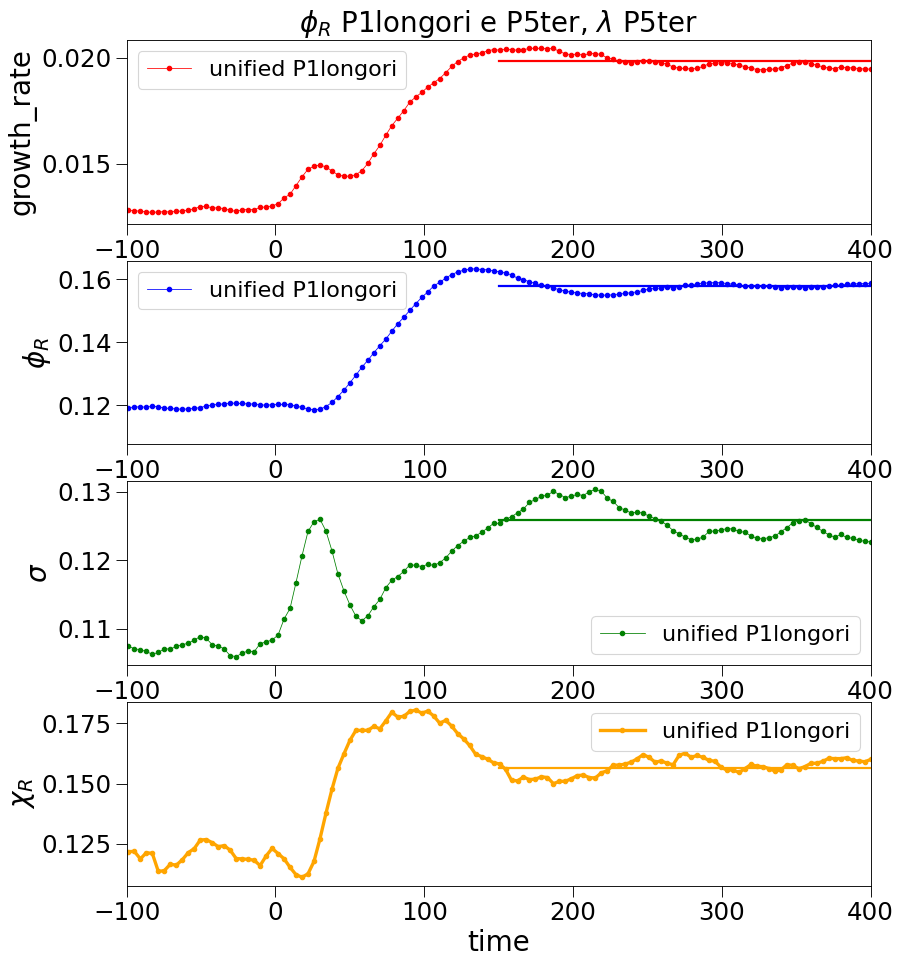

In [5]:
fig=plt.figure(num=None, figsize=(12, 14), dpi=80, facecolor='w', edgecolor='k')

ax1= fig.add_subplot(4,1,1)
ax2 = fig.add_subplot(4,1,2)
ax3= fig.add_subplot(4,1,3)
ax4= fig.add_subplot(4,1,4)

ax1.set_title('$\phi_R$ P1longori e P5ter, $\lambda$ P5ter', fontsize=25)

#ax1.set_xlabel("time", fontsize=25)
ax1.set_ylabel('growth_rate', fontsize=25)

#ax2.set_xlabel("time", fontsize=25)
ax2.set_ylabel('$\phi_R$', fontsize=25)

#ax3.set_xlabel("time", fontsize=25)
ax3.set_ylabel('$\sigma$', fontsize=25)

ax4.set_xlabel("time", fontsize=25)
ax4.set_ylabel('$\chi_R$', fontsize=25)

ax1.set_xlim(-100,400)
ax2.set_xlim(-100,400)
ax3.set_xlim(-100,400)
ax4.set_xlim(-100,400)

ax1.tick_params(which='major', length=10, labelsize=22)
ax2.tick_params(which='major', length=10, labelsize=22)
ax3.tick_params(which='major', length=10, labelsize=22)
ax4.tick_params(which='major', length=10, labelsize=22)

#ax1.set_ylim(0.017,0.023)

ax1.plot(np.linspace(-300,400,len(bin_mean_new)),growth_mean_p5ter_u, 'ro-',markersize=4, linewidth=0.7, label= 'unified P1longori')
ax2.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.phi_r, 'bo-',markersize=4, linewidth=0.7, label= 'unified P1longori')
ax3.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.sigma, 'go-',markersize=4, linewidth=0.7, label= 'unified P1longori')

#ax3.plot(np.linspace(1,59,len(bin_mean_new[75:90])),bin_mean_new.sigma2_p1lo_p5t[75:90], 'ro-',markersize=4, linewidth=0.7, label= 'unified P1longori')
#ax3.plot(np.linspace(1,59,len(bin_mean_new[75:90])),yn, 'ro-',markersize=4, linewidth=0.7, label= 'unified P1longori')

ax4.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.chi_r, 'o-',color='orange',markersize=4, linewidth=3, label= 'unified P1longori')

ax1.axhline(y=np.array(growth_mean_p5ter_u[110:174]).mean(),xmin=0.5, color='red', linewidth=2)
ax2.axhline(y=np.array(bin_mean_new.phi_r[110:174]).mean(),xmin=0.5, color='blue', linewidth=2)
ax3.axhline(y=np.array(bin_mean_new.sigma[110:174]).mean(),xmin=0.5, color='green', linewidth=2)
ax4.axhline(y=np.array(bin_mean_new.chi_r[110:150]).mean(),xmin=0.5, color='orange', linewidth=2)


ax1.legend(fontsize=20)
ax2.legend(fontsize=20)
ax3.legend(fontsize=20)
ax4.legend(fontsize=20)



In [9]:
erikson_sigmachi=pd.read_csv('/home/valerio/tesi/erikson_chi_sigma.csv')
#f_interpol=scipy.interpolate.interp1d(erikson_sigmachi.sigma,erikson_sigmachi.chi, kind='cubic')
fit_par=np.polyfit(erikson_sigmachi.sigma,erikson_sigmachi.chi, 3)
p = np.poly1d(fit_par)


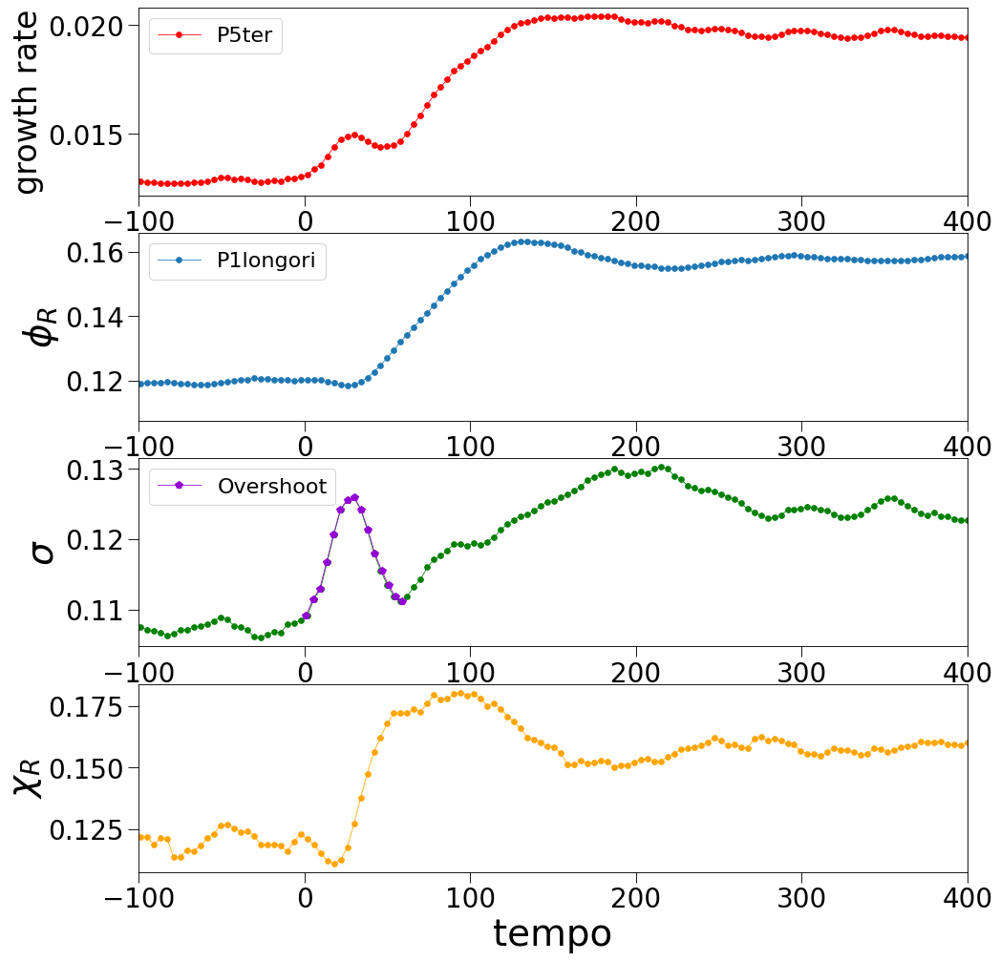

In [10]:
fig=plt.figure(num=None, figsize=(14, 15), dpi=80, facecolor='w', edgecolor='k')

ax1= fig.add_subplot(4,1,1)
ax2 = fig.add_subplot(4,1,2)
ax3= fig.add_subplot(4,1,3)
ax4= fig.add_subplot(4,1,4)

#ax1.set_title('Serie temporali', fontsize=30)

#ax1.set_xlabel("time", fontsize=25)
ax1.set_ylabel('growth rate', fontsize=30)

#ax2.set_xlabel("time", fontsize=25)
ax2.set_ylabel('$\phi_R$', fontsize=35)

#ax3.set_xlabel("time", fontsize=25)
ax3.set_ylabel('$\sigma$', fontsize=35)

ax4.set_xlabel("tempo", fontsize=35)
ax4.set_ylabel('$\chi_R$', fontsize=35)

ax1.set_xlim(-100,400)
ax2.set_xlim(-100,400)
ax3.set_xlim(-100,400)
ax4.set_xlim(-100,400)

ax1.tick_params(which='major', length=10, labelsize=25)
ax2.tick_params(which='major', length=10, labelsize=25)
ax3.tick_params(which='major', length=10, labelsize=25)
ax4.tick_params(which='major', length=10, labelsize=25)



#ax1.set_ylim(0.017,0.023)

ax1.plot(np.linspace(-300,400,len(bin_mean_new)),growth_mean_p5ter_u, 'ro-',markersize=5, linewidth=0.7, label= 'P5ter')
ax2.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.phi_r, 'o-',color='tab:blue',markersize=5, linewidth=0.7, label= 'P1longori')
ax3.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.sigma, 'go-',markersize=5, linewidth=0.7)

ax3.plot(np.linspace(1,59,len(bin_mean_new[75:90])),bin_mean_new.sigma[75:90], 'p-',color='darkviolet',markersize=7, linewidth=0.7, label= 'Overshoot')
#ax3.plot(np.linspace(1,59,len(bin_mean_new[75:90])),yn, 'ro-',markersize=4, linewidth=0.7, label= 'unificate P1longori')

ax4.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.chi_r, 'o-',color='orange',markersize=5, linewidth=0.7)

#ax1.axhline(y=np.array(growth_mean_p5ter_u[110:174]).mean(),xmin=0.5, color='red', linewidth=2)
#ax2.axhline(y=np.array(bin_mean_new.phi_r[110:174]).mean(),xmin=0.5, color='blue', linewidth=2)
#ax3.axhline(y=np.array(bin_mean_new.sigma[110:174]).mean(),xmin=0.5, color='green', linewidth=2)
#ax4.axhline(y=np.array(bin_mean_new.chi_r[110:150]).mean(),xmin=0.5, color='orange', linewidth=2)


ax1.legend(fontsize=20)
ax2.legend(fontsize=20)
ax3.legend(fontsize=20)
#ax4.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/time_series_sigma_overshoot.pdf')

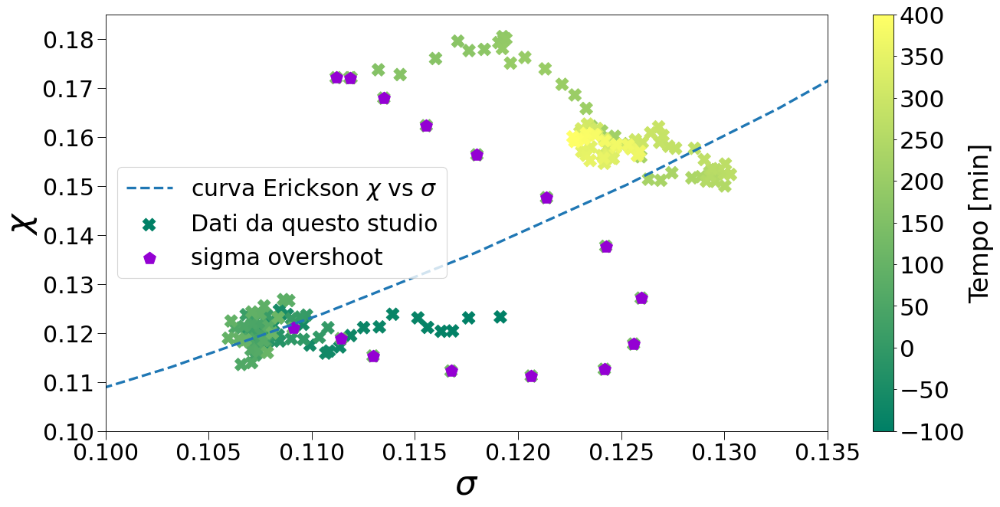

In [11]:
fig=plt.figure(num=None, figsize=(19,9), dpi=80, facecolor='w', edgecolor='k')
ax1= fig.add_subplot(1,1,1)

ax1.tick_params(which='major', length=10, labelsize=27)
#ax1.set_title('$\sigma$ vs $\chi$ - $\sigma$ overshoot marcato', fontsize=40)


ax1.set_ylabel("$\chi$", fontsize=40)
ax1.set_xlabel('$\sigma$', fontsize=40)

ax1.set_xlim(0.100,0.135)
ax1.set_ylim(0.10,0.185)

sc=ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=np.linspace(-100,400,175), cmap='summer',marker='X',s=220, label='Dati da questo studio')
ax1.scatter(bin_mean_new.sigma[75:90], bin_mean_new.chi_r[75:90], color='darkviolet', marker='p', s=220, label='sigma overshoot')
ax1.plot(np.linspace(0,0.14,20),p(np.linspace(0,0.14,20)), '--', color='tab:blue', markersize=10, linewidth=3, label='curva Erickson $\chi$ vs $\sigma$')
cb=plt.colorbar(sc,ax=ax1, ticks=np.linspace(-100,400,11), label='time')

cb.set_label(label='Tempo [min]', size=30)
cb.ax.tick_params(labelsize=28)


ax1.legend(fontsize=27)
plt.savefig('/home/valerio/tesi/data_managment/scatterplot_sigma_overshoot.pdf')

In [19]:
#faccio *diverse* interpolaziopni che 'tagliano' la gobba di sigma per vedere qual è il risultato nello scatter 
#sigma vs chi
t_fit=np.append(np.linspace(-300,400,len(bin_mean_new))[73:76],np.linspace(-300,400,len(bin_mean_new))[89:93])
sigma_fit=np.append(bin_mean_new.sigma[73:76],bin_mean_new.sigma[89:93])

t_fit1=np.append(np.linspace(-300,400,len(bin_mean_new))[73:76],np.linspace(-300,400,len(bin_mean_new))[100:104])
sigma_fit1=np.append(bin_mean_new.sigma[73:76],bin_mean_new.sigma[100:104])

f = interpolate.interp1d(t_fit, sigma_fit,kind='linear')
f1 = interpolate.interp1d(t_fit1, sigma_fit1,kind='linear')

yn=f(np.linspace(-6,70,len(bin_mean_new[73:93])))
sigma_interpolated=np.copy(bin_mean_new.sigma)
sigma_interpolated[73:93]=yn

yn1=f1(np.linspace(-6,114,len(bin_mean_new[73:104])))
sigma_interpolated1=np.copy(bin_mean_new.sigma)
sigma_interpolated1[73:104]=yn1



In [20]:
np.linspace(-300,400,len(p1longori_bin_mean))[100:104]

array([102.29885057, 106.32183908, 110.34482759, 114.36781609])

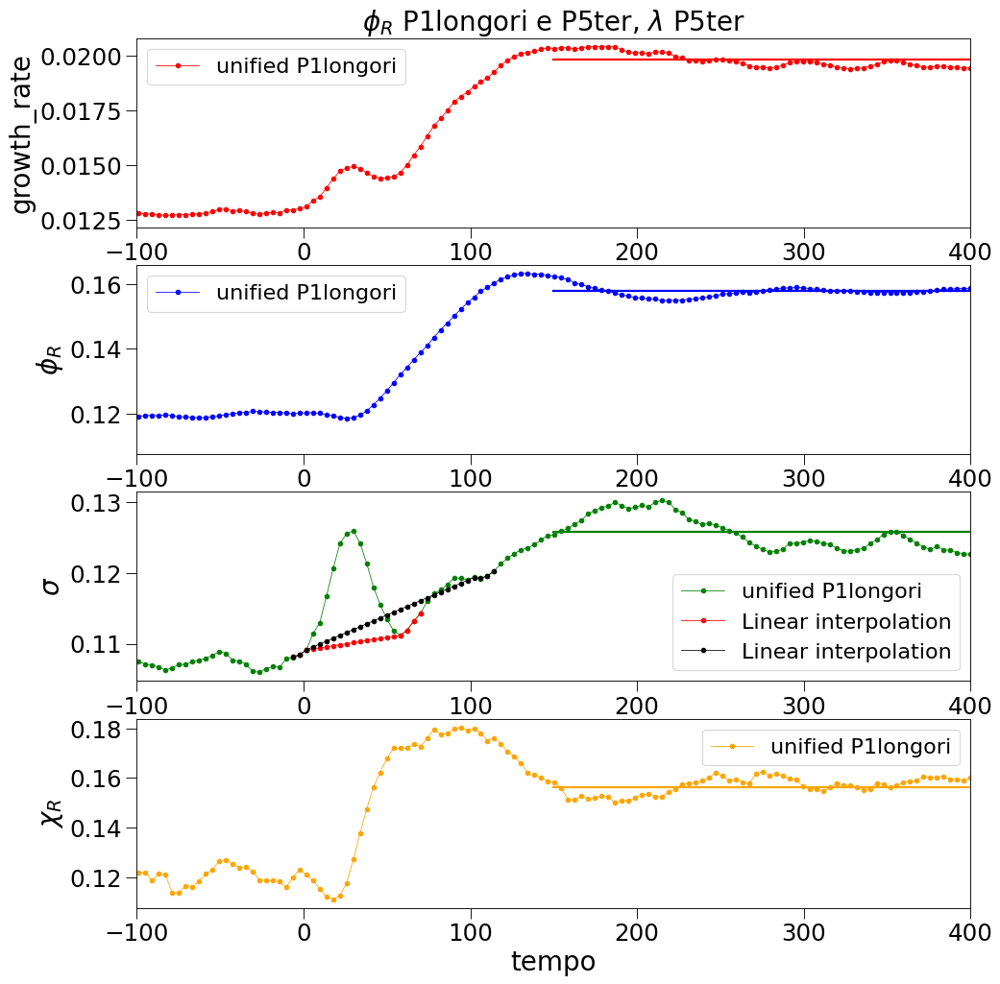

In [62]:
fig=plt.figure(num=None, figsize=(14, 15), dpi=80, facecolor='w', edgecolor='k')

ax1= fig.add_subplot(4,1,1)
ax2 = fig.add_subplot(4,1,2)
ax3= fig.add_subplot(4,1,3)
ax4= fig.add_subplot(4,1,4)

ax1.set_title('$\phi_R$ P1longori e P5ter, $\lambda$ P5ter', fontsize=25)

#ax1.set_xlabel("time", fontsize=25)
ax1.set_ylabel('growth_rate', fontsize=25)

#ax2.set_xlabel("time", fontsize=25)
ax2.set_ylabel('$\phi_R$', fontsize=25)

#ax3.set_xlabel("time", fontsize=25)
ax3.set_ylabel('$\sigma$', fontsize=25)

ax4.set_xlabel("tempo", fontsize=25)
ax4.set_ylabel('$\chi_R$', fontsize=25)

ax1.set_xlim(-100,400)
ax2.set_xlim(-100,400)
ax3.set_xlim(-100,400)
ax4.set_xlim(-100,400)

ax1.tick_params(which='major', length=10, labelsize=22)
ax2.tick_params(which='major', length=10, labelsize=22)
ax3.tick_params(which='major', length=10, labelsize=22)
ax4.tick_params(which='major', length=10, labelsize=22)


#ax1.set_ylim(0.017,0.023)

ax1.plot(np.linspace(-300,400,len(bin_mean_new)),growth_mean_p5ter_u, 'ro-',markersize=4, linewidth=0.7, label= 'unified P1longori')
ax2.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.phi_r, 'bo-',markersize=4, linewidth=0.7, label= 'unified P1longori')
ax3.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.sigma, 'go-',markersize=4, linewidth=0.7, label= 'unified P1longori')

#ax3.plot(np.linspace(1,59,len(bin_mean_new[75:90])),bin_mean_new.sigma[75:90], 'ro-',markersize=4, linewidth=0.7, label= 'unified P1longori')
#ax3.plot(np.linspace(-6,68,len(bin_mean_new[73:95])),yn, 'ro-',markersize=4, linewidth=0.7, label= 'linear interpolation')
ax3.plot(np.linspace(-300,400,len(bin_mean_new))[73:93],sigma_interpolated[73:93], 'o-',color='red',markersize=4, linewidth=0.7, label= 'Linear interpolation')
ax3.plot(np.linspace(-300,400,len(bin_mean_new))[73:104],sigma_interpolated1[73:104], 'o-',color='black',markersize=4, linewidth=0.7, label= 'Linear interpolation')


ax4.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.chi_r, 'o-',color='orange',markersize=4, linewidth=0.7, label= 'unified P1longori')

ax1.axhline(y=np.array(growth_mean_p5ter_u[110:174]).mean(),xmin=0.5, color='red', linewidth=2)
ax2.axhline(y=np.array(bin_mean_new.phi_r[110:174]).mean(),xmin=0.5, color='blue', linewidth=2)
ax3.axhline(y=np.array(bin_mean_new.sigma[110:174]).mean(),xmin=0.5, color='green', linewidth=2)
ax4.axhline(y=np.array(bin_mean_new.chi_r[110:150]).mean(),xmin=0.5, color='orange', linewidth=2)


ax1.legend(fontsize=20)
ax2.legend(fontsize=20)
ax3.legend(fontsize=20)
ax4.legend(fontsize=20)

#plt.savefig('/home/valerio/tesi/data_managment/time_series_sigma_interpolated.pdf')

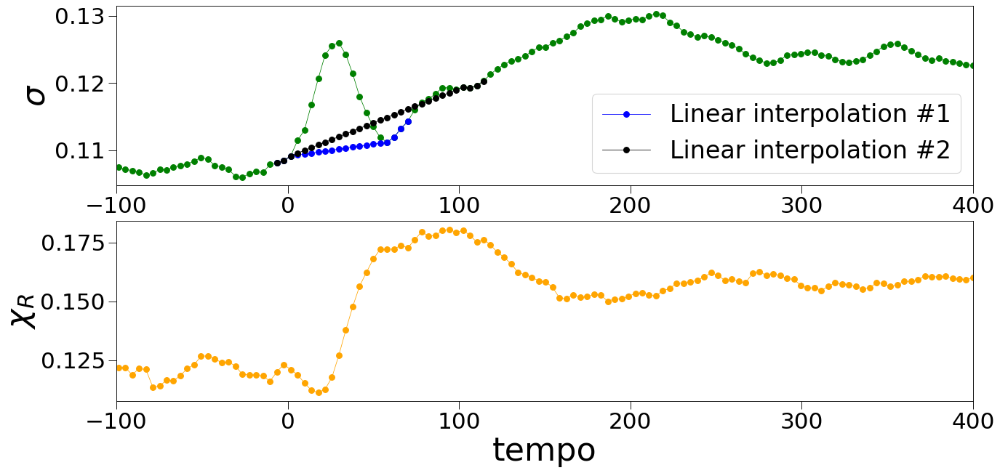

In [61]:
fig=plt.figure(num=None, figsize=(19, 9), dpi=80, facecolor='w', edgecolor='k')


ax3= fig.add_subplot(2,1,1)
ax4= fig.add_subplot(2,1,2)

#ax3.set_title('Serie temporali- $\sigma$ overshoot interpolato', fontsize=33)

#ax3.set_xlabel("time", fontsize=25)
ax3.set_ylabel('$\sigma$', fontsize=40)

ax4.set_xlabel("tempo", fontsize=40)
ax4.set_ylabel('$\chi_R$', fontsize=40)


ax3.set_xlim(-100,400)
ax4.set_xlim(-100,400)


ax3.tick_params(which='major', length=10, labelsize=28)
ax4.tick_params(which='major', length=10, labelsize=28)


#ax1.set_ylim(0.017,0.023)

ax3.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.sigma, 'go-',markersize=7, linewidth=0.7)

#ax3.plot(np.linspace(1,59,len(bin_mean_new[75:90])),bin_mean_new.sigma[75:90], 'ro-',markersize=4, linewidth=0.7, label= 'unified P1longori')
#ax3.plot(np.linspace(-6,68,len(bin_mean_new[73:95])),yn, 'ro-',markersize=4, linewidth=0.7, label= 'linear interpolation')
ax3.plot(np.linspace(-300,400,len(bin_mean_new))[73:93],sigma_interpolated[73:93], 'o-',color='blue',markersize=7, linewidth=0.7, label= 'Linear interpolation #1')
ax3.plot(np.linspace(-300,400,len(bin_mean_new))[73:104],sigma_interpolated1[73:104], 'o-',color='black',markersize=7, linewidth=0.7, label= 'Linear interpolation #2')


ax4.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.chi_r, 'o-',color='orange',markersize=7, linewidth=0.7)

#ax1.axhline(y=np.array(growth_mean_p5ter_u[110:174]).mean(),xmin=0.5, color='red', linewidth=2)
##ax2.axhline(y=np.array(bin_mean_new.phi_r[110:174]).mean(),xmin=0.5, color='blue', linewidth=2)
#ax3.axhline(y=np.array(bin_mean_new.sigma[110:174]).mean(),xmin=0.5, color='green', linewidth=2)
#ax4.axhline(y=np.array(bin_mean_new.chi_r[110:150]).mean(),xmin=0.5, color='orange', linewidth=2)



ax3.legend(fontsize=30)
#ax4.legend(fontsize=30)

plt.savefig('/home/valerio/tesi/data_managment/time_series_sigma_interpolated2.pdf')

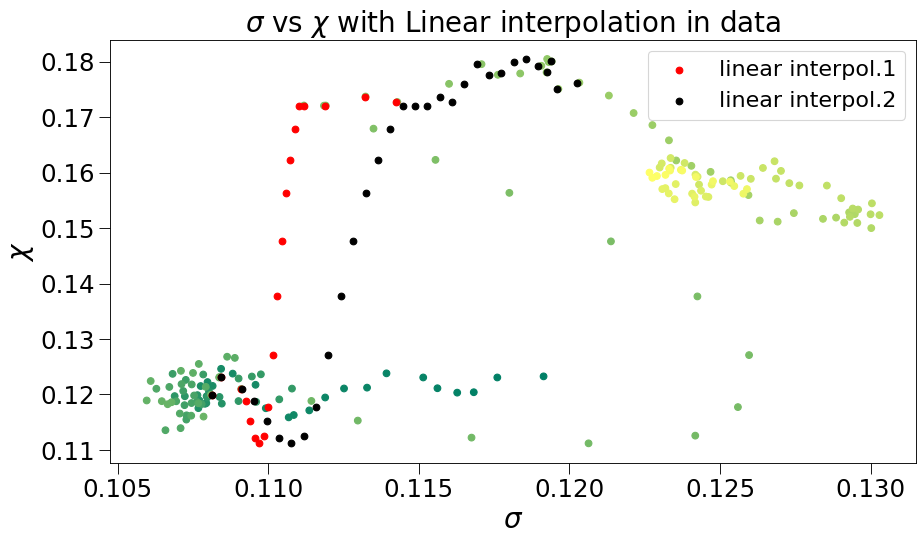

In [15]:
fig=plt.figure(num=None, figsize=(13,7), dpi=80, facecolor='w', edgecolor='k')
ax1= fig.add_subplot(1,1,1)

ax1.tick_params(which='major', length=10, labelsize=22)
ax1.set_title('$\sigma$ vs $\chi$ with Linear interpolation in data', fontsize=25)

ax1.set_ylabel("$\chi$", fontsize=25)
ax1.set_xlabel('$\sigma$', fontsize=25)



#ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=bin_mean_new.sigma, cmap='cool')
#ax1.scatter(yn, bin_mean_new.chi_r[73:95], color='black', cmap='green')
ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=np.linspace(0,2,175), cmap='summer')
ax1.scatter(sigma_interpolated[73:93], bin_mean_new.chi_r[73:93], c='red', label='linear interpol.1')
ax1.scatter(sigma_interpolated1[73:104], bin_mean_new.chi_r[73:104], c='black', label='linear interpol.2')

ax1.legend(fontsize=20)

plt.savefig('/home/valerio/tesi/data_managment/scatterplot_sigma_interpolated.pdf')

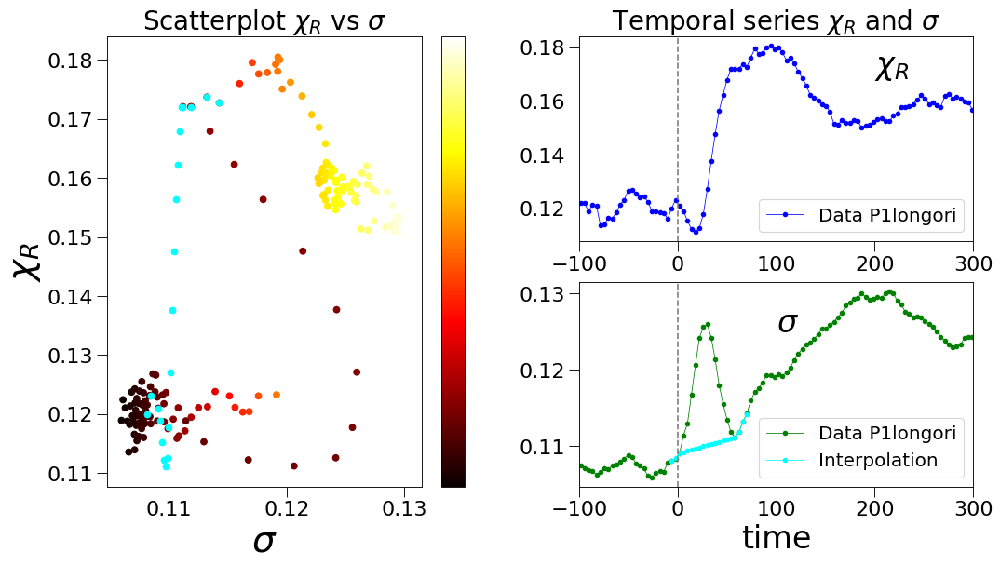

In [16]:
fig1=plt.figure(num=None, figsize=(15,8), dpi=80, facecolor='w', edgecolor='k')
gs=fig1.add_gridspec(2,2)
ax1=fig1.add_subplot(gs[:,0])
ax2=fig1.add_subplot(gs[0,1])
ax3=fig1.add_subplot(gs[1,1])

ax1.tick_params(which='major', length=10, labelsize=20)
ax2.tick_params(which='major', length=10, labelsize=20)
ax3.tick_params(which='major', length=10, labelsize=20)

ax1.set_title('Scatterplot $\chi_R$ vs $\sigma$ ', fontsize=25)
ax2.set_title('Temporal series $\chi_R$ and $\sigma$ ', fontsize=25)

cm= plt.cm.get_cmap('jet')

ax3.set_xlim(-100,300)
ax2.set_xlim(-100,300)

ax3.set_xlim(-100,300)
ax2.set_xlim(-100,300)

ax3.set_xlabel("time", fontsize=30)
ax1.set_xlabel('$\sigma$', fontsize=35)
ax1.set_ylabel('$\chi_R$', fontsize=35)

ax2.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.chi_r, 'bo-',markersize=4, linewidth=0.7, label= 'Data P1longori')
ax3.plot(np.linspace(-300,400,len(bin_mean_new)),bin_mean_new.sigma, 'go-',markersize=4, linewidth=0.7, label= 'Data P1longori')

#ax3.plot(np.linspace(1,59,len(bin_mean_new[75:90])),bin_mean_new.sigma[75:90], 'ro-',markersize=4, linewidth=0.7, label= 'unified P1longori')
#ax3.plot(np.linspace(-6,68,len(bin_mean_new[73:95])),yn, 'ro-',markersize=4, linewidth=0.7, label= 'linear interpolation')
ax3.plot(np.linspace(-300,400,len(bin_mean_new))[73:93],sigma_interpolated[73:93], 'o-',color='cyan',markersize=4, linewidth=0.7, label= 'Interpolation')
sc=ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=sigma_interpolated, cmap='hot')
ax1.scatter(sigma_interpolated[73:93], bin_mean_new.chi_r[73:93], c='cyan')
plt.colorbar(sc,ax=ax1, ticks=np.linspace(-100,400,11))

ax3.axvline(x=0, linestyle='--', color='grey')
ax2.axvline(x=0, linestyle='--', color='grey')

ax3.text(100,0.1250,'$\sigma$', fontsize=30)
ax2.text(200,0.17,'$\chi_R$', fontsize=30)

ax3.legend(fontsize=18)
ax2.legend(fontsize=18)

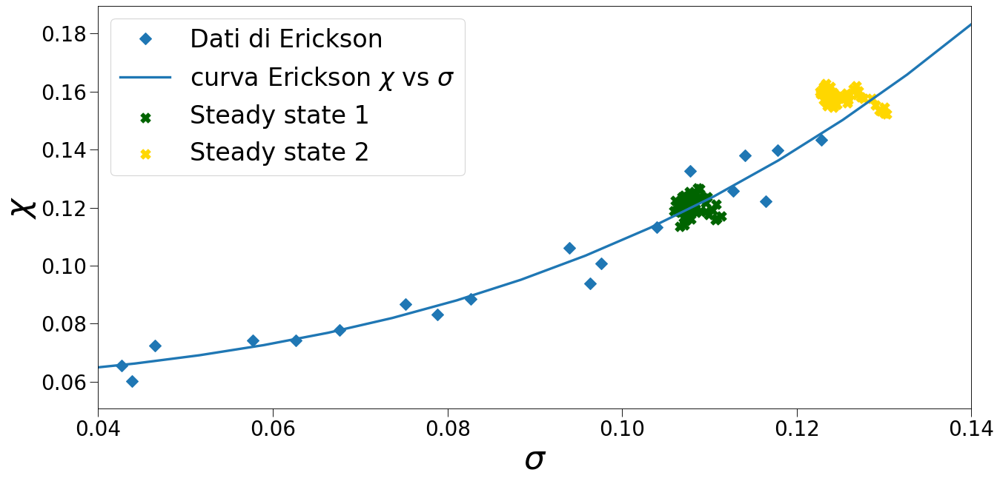

In [15]:
fig=plt.figure(num=None, figsize=(19,9), dpi=80, facecolor='w', edgecolor='k')
ax1= fig.add_subplot(1,1,1)

ax1.set_xlim(0.04,0.14)

ax1.tick_params(which='major', length=10, labelsize=25)
#ax1.set_title('$\sigma$ vs $\chi$ with Erickson data', fontsize=40)

ax1.set_ylabel("$\chi$", fontsize=40)
ax1.set_xlabel('$\sigma$', fontsize=40)


#ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=bin_mean_new.sigma, cmap='cool')
#ax1.scatter(yn, bin_mean_new.chi_r[73:95], color='black', cmap='green')
sc=ax1.scatter(bin_mean_new.sigma[10:75], bin_mean_new.chi_r[10:75], c='darkgreen', cmap='summer', label='Steady state 1',marker='X', s=140)
sc=ax1.scatter(bin_mean_new.sigma[125:], bin_mean_new.chi_r[125:], c='gold', cmap='summer', label='Steady state 2',marker='X', s=140)
#ax1.scatter(sigma_interpolated[73:93], bin_mean_new.chi_r[73:93], c='red', label='linear interpol.1')
#ax1.scatter(sigma_interpolated1[73:104], bin_mean_new.chi_r[73:104], c='black', label='linear interpol.2')
ax1.plot(erikson_sigmachi.sigma,erikson_sigmachi.chi, 'D', markersize=10, linewidth=3, label='Dati di Erickson')
ax1.plot(np.linspace(0,0.14,20),p(np.linspace(0,0.14,20)), '-', color='tab:blue', markersize=10, linewidth=3, label='curva Erickson $\chi$ vs $\sigma$')
#cb=plt.colorbar(sc,ax=ax1, ticks=np.linspace(-100,400,11), label='time')

#cb.set_label(label='Tempo [min]', size=30)
#cb.ax.tick_params(labelsize=28)

ax1.legend(fontsize=30)

plt.savefig('/home/valerio/tesi/data_managment/scatterplot_sigmachi_erickson_curve_steady.pdf')

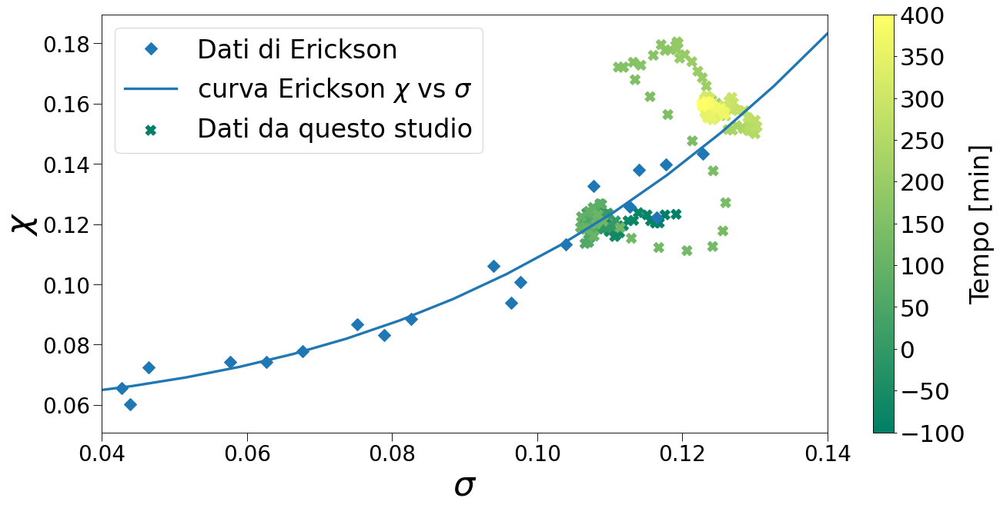

In [13]:
fig=plt.figure(num=None, figsize=(19,9), dpi=80, facecolor='w', edgecolor='k')
ax1= fig.add_subplot(1,1,1)

ax1.set_xlim(0.04,0.14)

ax1.tick_params(which='major', length=10, labelsize=25)
#ax1.set_title('$\sigma$ vs $\chi$ with Erickson data', fontsize=40)

ax1.set_ylabel("$\chi$", fontsize=40)
ax1.set_xlabel('$\sigma$', fontsize=40)


#ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=bin_mean_new.sigma, cmap='cool')
#ax1.scatter(yn, bin_mean_new.chi_r[73:95], color='black', cmap='green')
sc=ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=np.linspace(-100,400,175), cmap='summer', label='Dati da questo studio',marker='X', s=140)
#ax1.scatter(sigma_interpolated[73:93], bin_mean_new.chi_r[73:93], c='red', label='linear interpol.1')
#ax1.scatter(sigma_interpolated1[73:104], bin_mean_new.chi_r[73:104], c='black', label='linear interpol.2')
ax1.plot(erikson_sigmachi.sigma,erikson_sigmachi.chi, 'D', markersize=10, linewidth=3, label='Dati di Erickson')
ax1.plot(np.linspace(0,0.14,20),p(np.linspace(0,0.14,20)), '-', color='tab:blue', markersize=10, linewidth=3, label='curva Erickson $\chi$ vs $\sigma$')
cb=plt.colorbar(sc,ax=ax1, ticks=np.linspace(-100,400,11), label='time')

cb.set_label(label='Tempo [min]', size=30)
cb.ax.tick_params(labelsize=28)

ax1.legend(fontsize=30)

plt.savefig('/home/valerio/tesi/data_managment/scatterplot_sigmachi_erickson_curve.pdf')

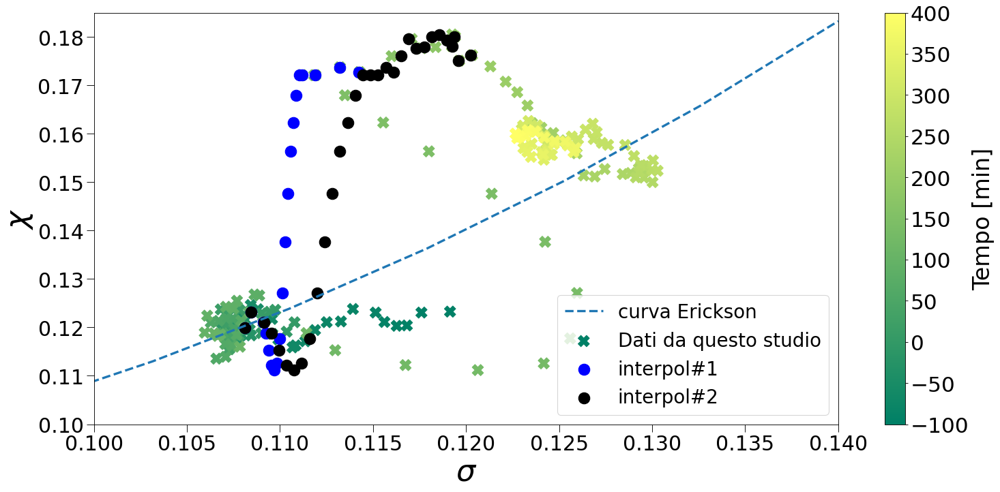

In [22]:
fig=plt.figure(num=None, figsize=(22,10), dpi=80, facecolor='w', edgecolor='k')
ax1= fig.add_subplot(1,1,1)

ax1.tick_params(which='major', length=10, labelsize=27)
#ax1.set_title('$\sigma$ vs $\chi$ - interpolazione lineare overshoot $\sigma$', fontsize=35)

ax1.set_ylabel("$\chi$", fontsize=40)
ax1.set_xlabel('$\sigma$', fontsize=40)

ax1.set_xlim(0.100,0.140)
ax1.set_ylim(0.10,0.185)

#ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=bin_mean_new.sigma, cmap='cool')
#ax1.scatter(yn, bin_mean_new.chi_r[73:95], color='black', cmap='green')
sc=ax1.scatter(bin_mean_new.sigma, bin_mean_new.chi_r, c=np.linspace(-100,400,175), cmap='summer',marker='X',s=220,label='Dati da questo studio')
ax1.scatter(sigma_interpolated[73:93], bin_mean_new.chi_r[73:93], c='blue', label='interpol#1',s=220)
ax1.scatter(sigma_interpolated1[73:104], bin_mean_new.chi_r[73:104], c='black', label='interpol#2',s=220)
ax1.plot(np.linspace(0,0.14,20),p(np.linspace(0,0.14,20)), '--', color='tab:blue', markersize=10, linewidth=3, label='curva Erickson')

cb=plt.colorbar(sc,ax=ax1, ticks=np.linspace(-100,400,11), label='time')

cb.set_label(label='Tempo [min]', size=30)
cb.ax.tick_params(labelsize=28)

ax1.legend(fontsize=25)

plt.savefig('/home/valerio/tesi/data_managment/scatterplot_sigmachi_erickson_interpolated.pdf')

# Steady state analysis

In [6]:
steady_p1longori_df=pd.DataFrame({'phi_r':[np.array(p1longori_bin_mean.p1lo_p5t_phi_r[10:74]).mean(),np.array(p1longori_bin_mean.p1lo_p5t_phi_r[110:174]).mean()],
                                  'growth':[np.array(growth_mean_p5ter_u[10:74]).mean(),np.array(growth_mean_p5ter_u[110:174]).mean()],
                                  'sigma':[np.array(p1longori_bin_mean.sigma2_p1lo_p5t[10:74]).mean(),np.array(p1longori_bin_mean.sigma2_p1lo_p5t[110:174]).mean()],
                                  'chi':[np.array(p1longori_bin_mean.chi2_r[10:74]).mean(),np.array(p1longori_bin_mean.chi2_r[110:174]).mean()]})


In [7]:
steady_p1ori_df=pd.DataFrame({'phi_r':[np.array(p1ori_bin_mean.p1o_p5t_phi_r[10:74]).mean(),np.array(p1ori_bin_mean.p1o_p5t_phi_r[110:174]).mean()],
                                  'growth':[np.array(growth_mean_p5ter_u[10:74]).mean(),np.array(growth_mean_p5ter_u[110:174]).mean()],
                                  'sigma':[np.array(p1ori_bin_mean.sigma2_p1o_p5t[10:74]).mean(),np.array(p1ori_bin_mean.sigma2_p1o_p5t[110:174]).mean()],
                                  'chi':[np.array(p1ori_bin_mean.chi2_r[10:74]).mean(),np.array(p1ori_bin_mean.chi2_r[110:174]).mean()]})


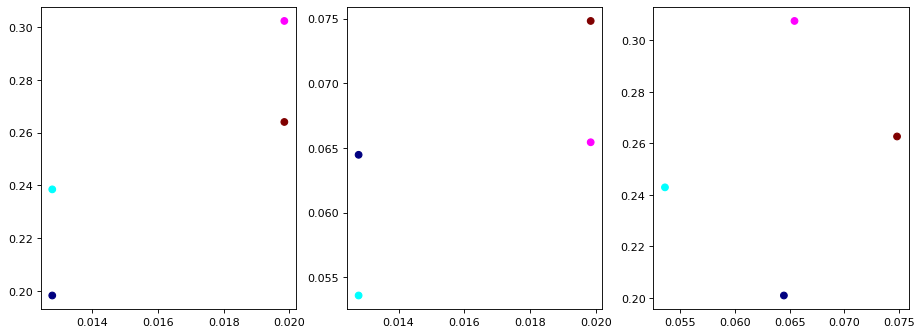

In [53]:
fig=plt.figure(num=None, figsize=(14,5), dpi=80, facecolor='w', edgecolor='k')
ax1= fig.add_subplot(1,3,1)
ax2 = fig.add_subplot(1,3,2)
ax3= fig.add_subplot(1,3,3)

ax1.scatter(steady_p1longori_df.growth, steady_p1longori_df.phi_r, c=steady_p1longori_df.growth, cmap='jet')
ax2.scatter(steady_p1longori_df.growth, steady_p1longori_df.sigma, c=steady_p1longori_df.growth, cmap='jet')
ax3.scatter(steady_p1longori_df.sigma, steady_p1longori_df.chi, c=steady_p1longori_df.growth, cmap='jet')

ax1.scatter(steady_p1ori_df.growth, steady_p1ori_df.phi_r, c=steady_p1ori_df.growth, cmap='cool')
ax2.scatter(steady_p1ori_df.growth, steady_p1ori_df.sigma, c=steady_p1ori_df.growth, cmap='cool')
ax3.scatter(steady_p1ori_df.sigma, steady_p1ori_df.chi, c=steady_p1ori_df.growth, cmap='cool')

# TENTATIVI DI SMOOTHING

In [8]:
itp = interpolate.interp1d(p1longori_bin_mean.time,p1longori_bin_mean.chi2_r, kind='linear')
yy_sg = scipy.signal.savgol_filter(itp(p1longori_bin_mean.time), 17, 3)

In [9]:
t_sm=np.append(p1longori_bin_mean.time[75:88],p1longori_bin_mean.time[103:115])
y_sm=np.append(yy_sg[75:88],yy_sg[103:115])
sm_chi=scipy.interpolate.interp1d(t_sm, y_sm, kind='cubic') 

y_sm=np.copy(yy_sg)
y_sm[75:115]=sm_chi(p1longori_bin_mean.time[75:115])

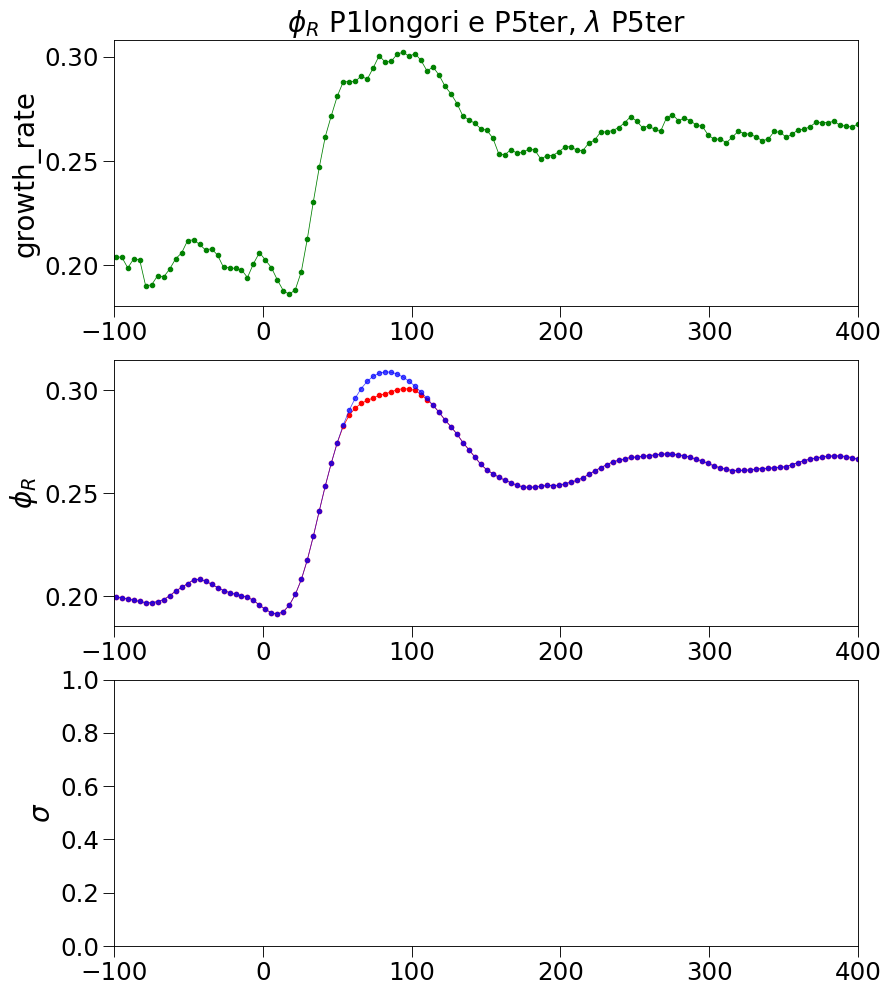

In [10]:
fig=plt.figure(num=None, figsize=(12, 15), dpi=80, facecolor='w', edgecolor='k')

ax1= fig.add_subplot(3,1,1)
ax2 = fig.add_subplot(3,1,2)
ax3= fig.add_subplot(3,1,3)

ax1.set_title('$\phi_R$ P1longori e P5ter, $\lambda$ P5ter', fontsize=25)

ax1.set_ylabel('growth_rate', fontsize=25)
ax2.set_ylabel('$\phi_R$', fontsize=25)
ax3.set_ylabel('$\sigma$', fontsize=25)

ax1.set_xlim(-100,400)
ax2.set_xlim(-100,400)
ax3.set_xlim(-100,400)

ax1.tick_params(which='major', length=10, labelsize=22)
ax2.tick_params(which='major', length=10, labelsize=22)
ax3.tick_params(which='major', length=10, labelsize=22)

ax2.plot(np.linspace(-300,400,len(p1longori_bin_mean)), yy_sg, 'ro-',markersize=4, linewidth=0.7, label= 'unified P1longori')
#ax2.plot(p1longori_bin_mean.time[75:115], sm_chi(p1longori_bin_mean.time[75:115]), 'bo-',markersize=4, linewidth=0.7, label= 'unified P1longori', alpha=0.3)
ax2.plot(np.linspace(-300,400,len(p1longori_bin_mean)), y_sm, 'bo-',markersize=4, linewidth=0.7, label= 'unified P1longori', alpha=0.7)


ax1.plot(np.linspace(-300,400,len(p1longori_bin_mean)), p1longori_bin_mean.chi2_r, 'go-',markersize=4, linewidth=0.7, label= 'unified P1longori')

#ax2.plot(np.linspace(-300,400,len(p1longori_bin_mean)),d_chi_r, 'bo-',markersize=4, linewidth=0.7, label= 'unified P1longori')
#ax3.plot(np.linspace(-300,400,len(p1longori_bin_mean)),d2_chi_r, 'go-',markersize=4, linewidth=0.7, label= 'unified P1longori')


#ax1.legend(fontsize=20)
#ax2.legend(fontsize=20)
#ax3.legend(fontsize=20)


# NEW MODEL IMPLEMENTATION

In [11]:
#x=((p1longori_bin_mean.chi2_r)-steady_p1longori_df.phi_r[1])
x=((y_sm)-steady_p1longori_df.phi_r[1])[75:]
x1=((yy_sg)-steady_p1longori_df.phi_r[1])[75:]

In [12]:
t_fit=np.array(p1longori_bin_mean.time[75:])
d_chi_r=derivata_sg(t_fit, x,11)
d2_chi_r=derivata_sg(t_fit, d_chi_r,11)


In [13]:
def chi_fit_new (x_data,a,b):
    d_fit=np.array(derivata_sg(t_fit, x_data,11))
    d2_fit=np.array(derivata_sg(t_fit, d_fit,11))
    return a*b*d2_fit+(a+b)*d_fit

In [14]:
popt,pcov= scipy.optimize.curve_fit(chi_fit_new,t_fit,-x, p0=[100,1])
popt

array([ 143.30745758, -143.30774606])

In [70]:
prova=chi_fit_new (x,15,10)

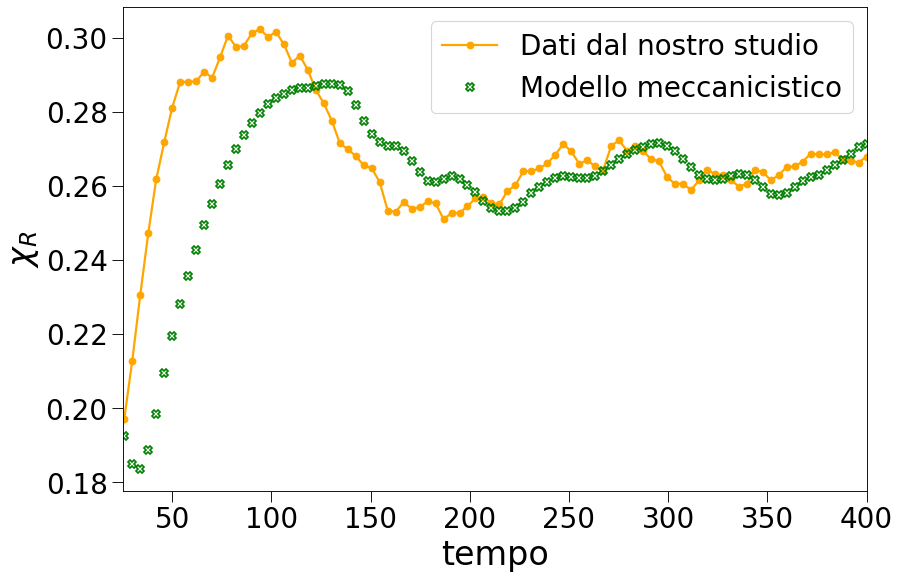

In [86]:
fig=plt.figure(num=None, figsize=(12, 8), dpi=80, facecolor='w', edgecolor='k')

ax1= fig.add_subplot(1,1,1)


#ax1.set_xlabel("time", fontsize=25)
ax1.set_ylabel('$\chi_R$', fontsize=30)
ax1.set_xlabel('tempo', fontsize=30)


#ax2.set_xlabel("time", fontsize=25)

ax1.set_xlim(25,400)


ax1.tick_params(which='major', length=10, labelsize=25)



#ax1.set_ylim(0.017,0.023)

#ax1.plot(t_fit, x, 'ro-',markersize=4, linewidth=0.7, label= 'data')
ax1.plot(np.linspace(-300,400,len(p1longori_bin_mean)), p1longori_bin_mean.chi2_r, 'o-',color='orange',markersize=6, linewidth=2, label= 'Dati dal nostro studio')
ax1.plot(t_fit, -prova+steady_p1longori_df.phi_r[1], 'g',marker='X',fillstyle='none',markeredgewidth=1.5,markersize=8, linewidth=0, label= 'Modello meccanicistico')




ax1.legend(fontsize=25)
#ax2.legend(fontsize=20)
#ax3.legend(fontsize=20)
plt.savefig('/home/valerio/tesi/data_managment/mecc_new_model.pdf')

In [ ]:
def sigma_mecc (phi, t , chi ):
    #sigma=0.0445
    dphi = np.array(sigma*phi)*(chi-phi)
    return dphi